# <center> Navigating Car Accidents in Santiago, Chile</center>
- Name: Cristobal Zamorano Astudillo 
- Class: Data 200, Fall 2019 - University of California, Berkeley
- Date: December 13, 2019

_Disclaimer: Original idea of this project was taken for [How safe are the streets of Santiago?](https://towardsdatascience.com/how-safe-are-the-streets-of-santiago-e01ba483ce4b), an article written by a Chilean Professor who does an exploratory analysis of Santiago's accidents of 2018 using GeoPandas. This project contains a superset of that article's dataset and some snippets of code from the article. However, we have included a much wider and diverse datasets. This disclaimer's purpose is to give credit to the inspiration of this project and by no means this project objective is the same as the article. The intention of this project is to apply the Data Science Lifecycle and Machine Learning  algorithms to make decisions in the future on how we can start thinking in effective policies to prevent deathly car accidents. Thank you.__

## Introduction

We are using Santiago, Chile as our city of interest since it is considered [one of the most populated cities in South America by 2019](https://en.wikipedia.org/wiki/List_of_South_American_metropolitan_areas_by_population). With a population of near 7 million people and an area of $247.5 mi^2$, Santiago makes an interesting case study. According to [INE (National Institute of Chilean Statistics)](https://www.t13.cl/noticia/nacional/ine-y-proyecciones-poblacion-censo-2017-2050-habra-216-millones-personas-chile), the increment of the Chilean population will increase by 2,8 million people by 2050. Today's dense population and projections of increased population, raises concern for future safety.

We want to investigate if there are conditions such as time or place, where the probability of deathly car accidents increase. In doing so, we can present the most important features that lead to deathly car accidents to the government, so that they they can create policies to prevent accidents based on solid data analysis. 


Our hypothesis and goal that we are trying to achieve in this project is to know __based on the car accidents data collected by the Chilean government, is it possible to construct a model powerful enough to predict if people would die or not when they engage in a car accident and what are the most important features that support the predictions.__ 

In [1]:
import numpy as np
import pandas as pd
import re
import calendar

import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
%matplotlib inline

import geopandas as gpd
from shapely.geometry import Point, LineString, Polygon
from pylab import rcParams

In [3]:
# sns.set(context='paper', style='ticks', palette='rainbow_r')
# mpl.rcParams['figure.dpi']= 150
# sns.mpl.rc("figure", figsize=(10, 6))
sns.set(palette='rainbow_r')
import matplotlib.style as style
style.use('fivethirtyeight')

In [177]:
import zipfile
with zipfile.ZipFile('./data/santiago_data.zip', 'r') as zip_ref:
    zip_ref.extractall('./data')

## Data Collection and Cleaning

We proceed to look for the necessry data. For this project we used:
- Vector Maps: gives as the shape, perimeter, area of the city.
- Streets Maps: to have the name of the streets so we can plot onto the Vector Maps.
- Accidents Data: this where mostly of our prediction and analyisis will happen.
- 2017 Census Data: data about the population density of each district. 

### Loading the Vector Maps

This dataset can be download [here](https://www.bcn.cl/obtienearchivo?id=repositorio/10221/10405/2/Areas_Pobladas.zip). This dataset is a zip file __Vector Maps of Chilean cities__. The zip file contains different data format of 387 cities and towns of the Chilean territory. The data was compiled by the [__Chilean National Congress LIbrary (BCN)__](https://www.bcn.cl/), which is a service of the Chilean Senate and the Chamber of Deputies whose mission is "to contribute to the linking of the National Congress of Chile with citizens, giving access to its legal and historical heritage, and promoting instances of dialogue and reflection between parliamentarians and civil society." 

The idea behind the Vector Maps is to look for a city of interest coordinate system to visualize our data. In this project we restricted ourselves to analyze the chilean capital, Santiago. In other words, we will only be using a very small subset of this dataset.


We will proceed cleaning the data:
- We will translate the names of columns from Spanish to English.
- We will translate the type of community to from Spanish to English.
- We will exclude 13 cities that have questionable names. We drop these rows because for our purpose we are only interested in an spoecific city's geodata. We thought that it is necessary to clean entire dataset as much as possible for future study.

In [174]:
cities = gpd.read_file("data/BCN/areas_urbanas/areas_urbanas.shp", encoding='utf-8')
cities = cities.rename(columns = {"NOMBRE": "Name", "TIPO_AREA":"Area Type"})
cities["Area Type"].replace(inplace=True,to_replace="Ciudad",value="City")
cities["Area Type"].replace(inplace=True,to_replace="Pueblo",value="Town")
cities["Area Type"].replace(inplace=True,to_replace="Aldea",value="Village")
cities["Area Type"].replace(inplace=True,to_replace="Localidad",value="Small Town")
cities["Area Type"].replace(inplace=True,to_replace="Caserio",value="Rural Community")
cities = cities[cities["Name"].str.contains("\w[\s]?", na=False)]
cities.reset_index(drop=True, inplace=True)
cities.tail()

,Name,Area Type,SHAPE_Leng,SHAPE_Area,geometry
382,Calama,City,7266.159446,1.085889e+06,"POLYGON ((507769.380 7513016.014, 507675.867 7..."
383,Puerto Aysen,City,5410.583898,1.123116e+06,"POLYGON ((210689.999 4964388.485, 210703.516 4..."
384,Cohaique,City,17677.879995,6.317038e+06,"POLYGON ((259973.620 4947324.020, 259774.760 4..."
385,Chile Chico,Town,5641.875304,1.283623e+06,"POLYGON ((291972.658 4842628.158, 292039.346 4..."
386,Talcahuano,City,83548.165913,3.100519e+07,"POLYGON ((136052.580 5921780.429, 133504.854 5..."


Let's identify our city of interest's coordinates, which again is Santiago.

Working we geodata also requires us to work in an specific coordinate system. In cartography, the act of transforming coordinates from 3d to a 2d plane is called Projection. In the Data 100 - Fall 2019 class we dicussed about the mathematical concept of Projections from Linear algebra ad how they are related to PCA, a unsupervised learning technique used to reduce the Dimensionality of the data. We won't be using PCA in this project, but the idea of Projection is somewhat similar in cartography. 

We decided to use the __EPSG:4326__ projection since most our data came from as unprojected *datum*. A *datum* is defined by Corey [in his article](https://source.opennews.org/articles/choosing-right-map-projection/) as a mathematical modeling of the Earth to the shape of a spheroid. In other words, it is geometric approximation. Each *datum* has a different type of projections, "but a spatial reference system is only "projected: when it has been mathematically translated to a 2D surface".

EPSG:4326 is one of the most conventional ones and we will stick to it.

In [5]:
santiago_map = cities[cities["Name"] == "Santiago"]
santiago_map = santiago_map.to_crs({'init': 'epsg:4326'})

Using `Geopandas` we can plot the coordinates of Santiago. Below is the plot of the city of Santiago, Chile where it lives within the EPSG:4326 coordinate system.

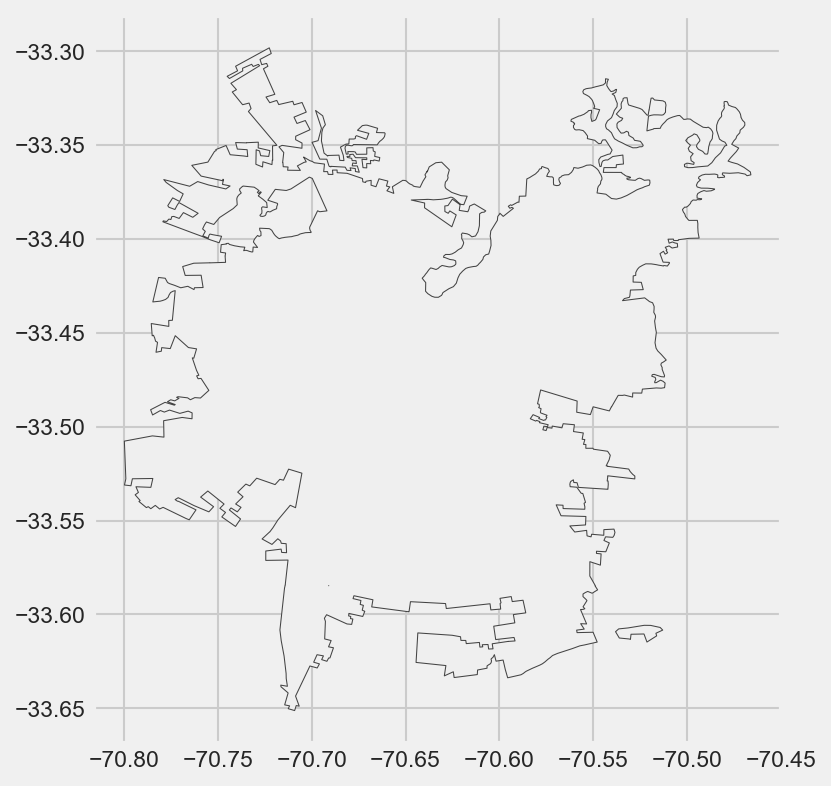

In [6]:
santiago_map.plot(color='#EFEFEF', edgecolor='#444444');

### Loading the Santiago's Streets Data

Now we will proceed to load the Santiago's streets dataset. This data can be downloaded by clicking in [this zip file](http://download.geofabrik.de/south-america/chile-latest-free.shp.zip).The dataset was compiled by [__GEOFABRIK__](http://download.geofabrik.de/south-america/chile.html), a community-maintained and free open source database that provides geodata from many different parts of the world that mainly works with free data from [__OpenStreetMap__](https://www.openstreetmap.org/). They are constantly updating, cleaning, and maintaining their databases for free public user access.

The zip file contains the data of the streets of Chile in different data format. For purpose of this project we will be using `.shp` file.

[Here](http://download.geofabrik.de/osm-data-in-gis-formats-free.pdf) is a pdf file with the documentation of this data written by Geofabrik. Here the reader can find descriptions of each column, description of data sources more in details, the relationships of Geofrabik data mining and OpenStreetMap, licenses that guarantees that this is a free source of data, the meaning of each feature class, among others. We use the pdf file to guide us in understanding how the data was compiled for us and understand the language they use to name their data's features. 

From the documentation of this dataset, it says that the  this dataset it was not required to convert the spatial coordinate system to __ESPG:4326__ since the documentation says that "All coordinates are unprojected WGS84 (EPSG:4326)". However, we found that when comparing the `geometry` column of 
 
`path = "../data/OSM_Chile/chile-latest-free-file/gis_osm_roads_free_1.shp"`

`santiago_streets_alfa = gpd.read_file(path, , encoding='utf-8')`

`santiago_streets_beta = gpd.read_file(path, , encoding='utf-8').to_crs({'init': 'epsg:4326'})`

`santiago_streets_alfa["geometry"] == santiago_streets_beta["geometry"]`

The output of above was `False`. Therefore we decided to change the coordinate system using `.to_crs({'init': 'epsg:4326'})`

For data cleaning:
- We change the name of the colum `fclass` to `street type`. Because for our purpose the feature class of interest in this data set is the type of streets. E.g.: We are interested in being able to differentiate in a pedestrian street (footway) or a highway for cars.
- We also dropped the rows that had `None` as value in the `name` column. Since the name of the streets does not exists then we thought it was better to drop those rows.

In [7]:
santiago_streets_file = gpd.read_file("data/OSM_Chile/chile-latest-free-file/gis_osm_roads_free_1.shp", encoding='utf-8')
santiago_streets = santiago_streets_file.to_crs({'init': 'epsg:4326'})
santiago_streets.rename(columns = {"fclass": "street type"}, inplace = True)
santiago_streets.dropna(subset = ['name'], inplace = True)
santiago_streets.reset_index(drop=True, inplace=True)
santiago_streets.head()

,osm_id,code,street type,name,ref,oneway,maxspeed,layer,bridge,tunnel,geometry
0,7981156,5121,unclassified,21 de Mayo,None,B,0,0,F,F,"LINESTRING (-70.65020 -33.43489, -70.65024 -33..."
1,7981159,5114,secondary,Irene Morales,None,F,0,0,F,F,"LINESTRING (-70.63704 -33.43686, -70.63691 -33..."
2,7981160,5122,residential,Rosas,None,F,0,0,F,F,"LINESTRING (-70.65020 -33.43489, -70.65028 -33..."
3,7981313,5134,secondary_link,Teatinos,None,F,0,0,F,F,"LINESTRING (-70.65497 -33.43251, -70.65544 -33..."
4,7981317,5113,primary,San Antonio,None,F,0,0,F,F,"LINESTRING (-70.64872 -33.43309, -70.64875 -33..."


### Loading  Accidents Data

The Motorized Vehicles accidents was compiled by [__CONASET__](http://mapas-conaset.opendata.arcgis.com/) a Chilean goverment department of transit security. This dataset was elaborated with the help of [__Carabineros de Chile__](https://en.wikipedia.org/wiki/Carabineros_de_Chile), they are the national police department of Chile. In other words, Carabineros de Chile record the data since they are the ones who are present after an accident happens and then the data is take to CONASET to be processed and file

The datasets consist the registered list of accidents in the years 2015-2018. All accidents involve cars somehow.

It can be downloaded as zip files here:
- [2015](https://opendata.arcgis.com/datasets/dafa26dbce99467985596d8a58216b79_0.zip)
- [2016](https://opendata.arcgis.com/datasets/32ee49c703b840b885b9c80b37ae72d0_0.zip)
- [2017](https://opendata.arcgis.com/datasets/907addac92b74e3fa30d40edb72d1813_0.zip)
- [2018](https://www.arcgis.com/sharing/rest/content/items/ff520ff145614d5585f9905892e48957/data) 

Data cleaning:

- The data from 2015 was not the most detailed in terms of their features and the most detailed dataset was the 2018 accident dataset.

- It seems like the every year the CONASET and Carabineros have been improving the quality of dataset that they have been uploading. However, they still could have more informative information for they values such as Weather, or type of Streets or Roads. 



In [8]:
conaset_2018 = gpd.read_file("data/CONASET/SiniestrosRM2018/SiniestrosRM2018.shp", encoding = 'utf-8')
conaset_2018 = conaset_2018.rename(columns = {'id': 'ID', 
                                        'Ano':"Year",
                                        'IdAccident': 'Accident ID', 
                                        'Fecha':'Date',
                                        'Hora' :'Hour',
                                        'Cod_Comuna' : 'District_code',
                                        'Comuna': 'District',
                                        'Cod_Region': 'Region_code',
                                        'Cod_TipoAc' : 'Accident Type Code',
                                        'TipoAccide': 'Accident Type',
                                        'CodTipo_CO': 'CONASET Code Type',
                                        'Tipo_CONAS': 'CONASET Type', 
                                        'Cod_Zona':'Zone Code', 
                                        'Zona':'Zone',
                                        'Cod_Ubicac':'Location Code',
                                        'UbicacionR': 'Location',
                                        'Cod_Causa_':'Cause Code_',
                                        'Causa_CONA': 'Cause CONASET',
                                        'Cod_Causa' : "Cause Code",
                                        'Causa': 'Cause',
                                        'Cod_Calle_': "Street Code 1",
                                        'CalleUno' : "Street 1",
                                        'Cod_CalleD':'Street Code 2',
                                        'CalleDos': 'Street 2',
                                        'Numero': 'Number',  
                                        'Cod_Calzad' : 'Sidewalk Code', 
                                        'Calzada':'Sidewalk',
                                        'TipoCalzad':"Sidewalk Type",
                                        'Cod_Estado' : 'State Code', 
                                        'EstadoCalz': 'Sidewalk State',
                                        'Cod_Condic':'Weather Code',
                                        'CondicionC': 'Weather',
                                        'EstadoAtmo':'Atmospheric State',
                                        'Fallecidos':"Deaths Quantity", 
                                        'Graves':"Serious Injuries",
                                        'Menos_Grav':'Medium Injuries',
                                         'Leves':"Minor Injuries"})
# conaset_2018.columns
conaset_2018 = conaset_2018[["Year",  'Date','Hour','District','Accident Type','Zone','Location',
                            'Cause',"Street 1","Street 2",'Sidewalk',"Sidewalk Type",'Sidewalk State', 'Weather','Atmospheric State',
                            "Deaths Quantity", "Serious Injuries",'Medium Injuries',"Minor Injuries", 'geometry']]
conaset_2018.reset_index(drop=True, inplace=True)


In [9]:
conaset_2017 = gpd.read_file("data/CONASET/SiniestrosRM2017/SiniestrosRM2017.shp", encoding = 'utf-8')
conaset_2017 = conaset_2017.rename(columns = {'FID': 'ID', 
                                        'Año':"Year",
                                        'IdAccident': 'Accident ID', 
                                        'Fecha':'Date',
                                        'Hora' :'Hour',
                                        'Cod_Comuna' : 'District_code',
                                        'Comuna': 'District',
                                        'Cod_Region': 'Region_code',
                                        'Cod_TipoAc' : 'Accident Type Code',
                                        'Tipo_Accid': 'Accident Type',
                                        'CodTipo_CO': 'CONASET Code Type',
                                        'Tipo_CONAS': 'CONASET Type', 
                                        'Cod_Zona':'Zone Code', 
                                        'Zona':'Zone',
                                        'Cod_Ubicac':'Location Code',
                                        'Ubicación': 'Location',
                                        'Cod_Causa_':'Cause Code_',
                                        'Causa_CONA': 'Cause CONASET',
                                        'Cod_Causa' : "Cause Code",
                                        'Causa': 'Cause',
                                        'Cod_Calle_': "Street Code 1",
                                        'Calle_Uno' : "Street 1",
                                        'Cod_CalleD':'Street Code 2',
                                        'Calle_Dos': 'Street 2',
                                        'Numero': 'Number',  
                                        'Cod_Calzad' : 'Sidewalk Code', 
                                        'Calzada':'Sidewalk',
                                        'Tipo_Calza':"Sidewalk Type",
                                        'Cod_Estado' : 'State Code', 
                                        'EstadoCalz': 'Sidewalk State',
                                        'Cod_Condic':'Weather Code',
                                        'CondicionC': 'Weather',
                                        'EstadoAtmo':'Atmospheric State',
                                        'Fallecidos':"Deaths Quantity", 
                                        'Graves':"Serious Injuries",
                                        'Menos_Grav':'Medium Injuries',
                                               'Leves':"Minor Injuries"})
# conaset_2017.columns
conaset_2017 = conaset_2017[[ "Year",  'Date','Hour','District','Accident Type','Zone','Location',
                            'Cause',"Street 1","Street 2",'Sidewalk',"Sidewalk Type",
                            "Deaths Quantity", "Serious Injuries",'Medium Injuries',"Minor Injuries", 'geometry']]
#exclude Weather, Atomospheric State, Sidewalk Type
conaset_2017.reset_index(drop=True, inplace=True)


In [10]:
conaset_2016 = gpd.read_file("data/CONASET/SiniestrosRM2016/SiniestrosRM2016.shp", encoding = 'utf-8')
conaset_2016 = conaset_2016.rename(columns = {'FID': 'ID', 
                                        'Año':"Year",
                                        'IdAccident': 'Accident ID', 
                                        'Fecha':'Date',
                                        'Hora' :'Hour',
                                        'Cod_Comuna' : 'District_code',
                                        'Comuna': 'District',
                                        'Cod_Region': 'Region_code',
                                        'Cod_TipoAc' : 'Accident Type Code',
                                        'Tipo_Accid': 'Accident Type',
                                        'CodTipo_CO': 'CONASET Code Type',
                                        'Tipo_CONAS': 'CONASET Type', 
                                        'Cod_Zona':'Zone Code', 
                                        'Zona':'Zone',
                                        'Cod_Ubicac':'Location Code',
                                        'Ubicación': 'Location',
                                        'Cod_Causa_':'Cause Code_',
                                        'Causa_CONA': 'Cause CONASET',
                                        'Cod_Causa' : "Cause Code",
                                        'Causa': 'Cause',
                                        'Cod_Calle_': "Street Code 1",
                                        'Calle_Uno' : "Street 1",
                                        'Cod_CalleD':'Street Code 2',
                                        'Calle_Dos': 'Street 2',
                                        'Numero': 'Number',  
                                        'Cod_Calzad' : 'Sidewalk Code', 
                                        'Calzada':'Sidewalk',
                                        'Tipo_Calza':"Sidewalk Type",
                                        'Cod_Estado' : 'State Code', 
                                        'EstadoCalz': 'Sidewalk State',
                                        'Cod_Condic':'Weather Code',
                                        'CondicionC': 'Weather',
                                        'EstadoAtmo':'Atmospheric State',
                                        'Fallecidos':"Deaths Quantity", 
                                        'Graves':"Serious Injuries",
                                        'Menos_Grav':'Medium Injuries',
                                               'Leves':"Minor Injuries"})
# conaset_2016.columns
conaset_2016 = conaset_2016[["Year",  'Date','Hour','District','Accident Type','Zone','Location',
                            'Cause',"Street 1","Street 2",'Sidewalk',"Sidewalk Type", 
                            "Deaths Quantity", "Serious Injuries",'Medium Injuries',"Minor Injuries", 'geometry']]
conaset_2016.reset_index(drop=True, inplace=True)

#exclude Weather, Atomospheric State, Sidewalk Type

In [11]:
conaset_2015 = gpd.read_file("data/CONASET/SiniestrosRM2015/SiniestrosRM2015.shp", encoding = 'utf-8')
conaset_2015 = conaset_2015.rename(columns = {'FID': 'ID', 
                                        'Año':"Year",
                                        'IdAccident': 'Accident ID', 
                                        'Fecha':'Date',
                                        'Hora' :'Hour',
                                        'Cod_Comuna' : 'District_code',
                                        'Comuna': 'District',
                                        'Cod_Region': 'Region_code',
                                        'Cod_TipoAc' : 'Accident Type Code',
                                        'Tipo_Accid': 'Accident Type',
                                        'CodTipo_CO': 'CONASET Code Type',
                                        'Tipo_CONAS': 'CONASET Type', 
                                        'Cod_Zona':'Zone Code', 
                                        'Zona':'Zone',
                                        'Cod_Ubicac':'Location Code',
                                        'Ubicación': 'Location',
                                        'Cod_Causa_':'Cause Code_',
                                        'Causa_CONA': 'Cause CONASET',
                                        'Cod_Causa' : "Cause Code",
                                        'Causa': 'Cause',
                                        'Cod_Calle_': "Street Code 1",
                                        'CalleUno' : "Street 1",
                                        'Cod_CalleD':'Street Code 2',
                                        'CalleDos': 'Street 2',
                                        'Numero': 'Number',  
                                        'Cod_Calzad' : 'Sidewalk Code', 
                                        'Calzada':'Sidewalk',
                                        'Tipo_Calza':"Sidewalk Type",
                                        'Cod_Estado' : 'State Code', 
                                        'EstadoCalz': 'Sidewalk State',
                                        'Cod_Condic':'Weather Code',
                                        'CondicionC': 'Weather',
                                        'EstadoAtmo':'Atmospheric State',
                                        'Fallecido':"Deaths Quantity", 
                                        'Grave':"Serious Injuries",
                                        'MGrave':'Medium Injuries',
                                               'Leve':"Minor Injuries"})
conaset_2015 = conaset_2015[["District", 'Street 1', 'Street 2',
                            "Deaths Quantity", "Serious Injuries","Minor Injuries", 'geometry']]
#excluded "Year",  'Date','Hour','Accident Type','Zone','Location','Cause','Sidewalk',"Sidewalk Type",'Sidewalk State', 'Weather','Atmospheric State'

conaset_2015.reset_index(drop=True, inplace=True)


### Feature Engineering 

Most Feature Engineering of this project happens in the upcoming cells below.

- We change the format of `Date` feature to a more Python friendly.
- Extract the monthly information and created a `Month` feature
- Extract the daily information and created a `Day` feature
- Extract the quartely information and created a `Quarter` feature
- We calculated the day and week of an accident with respect to their Year and create `Day Of Year` and `Week_of_Year` feature respectively.
- Created `lambda` function to filter the `Date` by season and the create feature `Season`.
- Many of the district of Santiago were misspelled so we modify many values of the `District` feature.
- Create a column `Death` that is a binary column of 1s and 0s that tell us that whether or not a person died in the accident. It does not tell quantity.
- We created a `Holiday` feature with the list of Holidays from 2016 to 2018 that were celebrated nationwide.
- We converted the months and days into their numeric form. Those are `Month_Numeric` and `Day_Numeric` respectively.

In [12]:
frames = [conaset_2015, conaset_2016, conaset_2017, conaset_2018]

# conaset_df.rename
conaset_df = pd.concat(frames)
conaset_df.dropna(subset = ['Date'], inplace = True)
conaset_df["Hour"].replace(inplace=True,to_replace="1899-12-30T00:00:00.000Z",value="00:00")
conaset_df["Date"] = pd.to_datetime(conaset_df["Date"], utc = True)
conaset_df["Hour"] = pd.to_datetime(conaset_df['Hour'], format='%H:%M' , utc = True).dt.hour
conaset_df["Month"] = pd.to_datetime(conaset_df["Date"], utc = True).dt.month 
conaset_df['Month'] = conaset_df['Month'].apply(lambda x: calendar.month_abbr[x])
conaset_df["Day"] = pd.to_datetime(conaset_df["Date"], utc = True).dt.weekday_name
conaset_df["Year"] = pd.to_datetime(conaset_df["Date"], utc = True).dt.year
conaset_df["Week_of_Year"] = pd.to_datetime(conaset_df["Date"], utc = True).dt.weekofyear
conaset_df["Day Of Year"] = pd.to_datetime(conaset_df["Date"], utc = True).dt.dayofyear
conaset_df["Quarter"] = pd.to_datetime(conaset_df["Date"], utc = True).dt.quarter
conaset_df["Date"] = pd.to_datetime(conaset_df["Date"], utc = True).dt.date

season_dict = lambda x: "Summer" if ((x< 12) | (x >= 51)) else "Fall" if ((x >= 12) & (x < 25)) else "Winter" if ((x >= 25) & (x < 38)) else "Spring"

conaset_df["Season"] = conaset_df["Week_of_Year"].map(season_dict)

conaset_df["District"].replace(["ÑUÑOA","ñuñoa"] , ["NUNOA" , "NUNOA"], inplace = True)
conaset_df["District"].replace(["PENALOLEN"] , ["PEÑALOLEN"], inplace = True)
conaset_df["District"].replace(["PE", "P. AGUIRRE CERDA"] , ["PEDRO AGUIRRE CERDA", "PEDRO AGUIRRE CERDA"], inplace = True)
conaset_df["District"].replace(["ESANTACION CENTRAL"] , ["ESTACION CENTRAL"], inplace = True)
# ['ALHUÉ', 'BUIN', 'CONCHALÍ', 'CURACAVÍ', 'EL MONTE', 'ESTACIÓN CENTRAL',
#        'ISLA DE MAIPO', 'MAIPÚ', 'MARÍA PINTO', 'MELIPILLA', 'PAINE',
#        'PEÑAFLOR', 'PEÑALOLÉN', 'SAN JOAQUÍN', 'SAN JOSÉ DE MAIPO',
#        'SAN PEDRO', 'SAN RAMÓN']
conaset_df["District"].replace(["ESTACION CENTRAL"] , ["ESTACIÓN CENTRAL"], inplace = True)
conaset_df["District"].replace(["CONCHALI"] , ["CONCHALÍ"], inplace = True)
conaset_df["District"].replace(["MAIPU"] , ["MAIPÚ"], inplace = True)
conaset_df["District"].replace(["PEÑALOLEN"] , ["PEÑALOLÉN"], inplace = True)
conaset_df["District"].replace(["SAN JOAQUIN"] , ["SAN JOAQUÍN"], inplace = True)
conaset_df["District"].replace(["SAN RAMON"] , ["SAN RAMÓN"], inplace = True)



conaset_df["Death"] = conaset_df["Deaths Quantity"].where(conaset_df["Deaths Quantity"] == 0, 1)

import datetime
holiday_list = [datetime.date(2018, 1, 1),
               datetime.date(2018, 3, 31),
               datetime.date(2018, 3, 30),
               datetime.date(2018, 5, 1),
               datetime.date(2018, 5, 21),
               datetime.date(2018, 7, 2),
               datetime.date(2018, 7, 16),
               datetime.date(2018, 8, 15),
               datetime.date(2018, 9, 17),
               datetime.date(2018, 9, 18),
               datetime.date(2018, 9, 19),
               datetime.date(2018, 10, 15),
               datetime.date(2018, 11, 1),
               datetime.date(2018, 11, 2),
               datetime.date(2018, 12, 8),
               datetime.date(2018, 12, 25),
               datetime.date(2018, 12, 31),
               datetime.date(2017, 1, 1),
               datetime.date(2017, 1, 2),
               datetime.date(2017, 4, 14),
               datetime.date(2017, 4, 15),
               datetime.date(2017, 5, 1),
               datetime.date(2017, 5, 21),
               datetime.date(2017, 6, 26),
               datetime.date(2017, 7, 16),
               datetime.date(2017, 8, 15),
               datetime.date(2017, 9, 18),
               datetime.date(2017, 9, 19),
               datetime.date(2017, 10, 9),
               datetime.date(2017, 10, 27),
               datetime.date(2017, 11, 1),
               datetime.date(2017, 12, 8),
               datetime.date(2017, 12, 25),
               datetime.date(2017, 12, 31),
               datetime.date(2016, 1, 1),
               datetime.date(2016, 3, 25),
               datetime.date(2016, 3, 26),
               datetime.date(2016, 5, 1),
               datetime.date(2016, 5, 21),
               datetime.date(2016, 6, 16),
               datetime.date(2016, 8, 15),
               datetime.date(2016, 9, 18),
               datetime.date(2016, 9, 17),
               datetime.date(2016, 9, 19),
               datetime.date(2016, 10, 10),
               datetime.date(2016, 10, 10),
               datetime.date(2016, 11, 1),
               datetime.date(2016, 10, 31),
               datetime.date(2016, 12, 8),
               datetime.date(2016, 12, 25),
               datetime.date(2016, 12, 31)]

conaset_df["Holiday"] = conaset_df["Date"].isin(holiday_list)

day_numeric = lambda x : 1 if x == "Monday" else 2 if x == "Tuesday" else 3 if x == "Wednesday" else 4 if x == "Thursday" else 5 if x == "Friday" else 6 if x == "Saturday" else 7
month_numeric = lambda x : 1 if x == "Jan" else 2 if x == "Feb" else 3 if x == "Mar" else 4 if x == "Apr" else 5 if x == "May" else 6 if x == "Jun" else 7 if x == "Jul" else 8 if x == "Aug" else 9 if x == "Sep" else 10 if x == "Oct" else 11 if x == "Novermber" else 12
conaset_df["Month_Numeric"] = conaset_df["Month"].map(month_numeric)
conaset_df["Day_Numeric"] = conaset_df["Day"].map(day_numeric)


conaset_df.rename(inplace=True, columns={"Sidewalk": "Road_Direction", "Sidewalk Type": "Road_Type"})
conaset_df.drop(inplace=True, columns=['Location', "Sidewalk State"])
conaset_df.reset_index(drop=True, inplace=True)
conaset_df.shape

/Users/cristobalza/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  after removing the cwd from sys.path.


(71947, 28)

In [13]:
conaset_df.columns

Index(['Accident Type', 'Atmospheric State', 'Cause', 'Date',
       'Deaths Quantity', 'District', 'Hour', 'Medium Injuries',
       'Minor Injuries', 'Serious Injuries', 'Road_Direction', 'Road_Type',
       'Street 1', 'Street 2', 'Weather', 'Year', 'Zone', 'geometry', 'Month',
       'Day', 'Week_of_Year', 'Day Of Year', 'Quarter', 'Season', 'Death',
       'Holiday', 'Month_Numeric', 'Day_Numeric'],
      dtype='object')

In [14]:
conaset_df["Cause"].value_counts().head(60)

CONDUCCION NO ATENTO CONDICIONES TRANSITO MOMENTO            16063
CAUSAS NO DETERMINADAS                                       13914
OTRAS CAUSAS                                                 10054
CONDUCCION SIN MANTENER DISTANCIA RAZONABLE NI PRUDENTE       4776
CONDUCCION CAMBIAR SORPRESIVAMENTE PISTA CIRCULACION          2890
PERDIDA CONTROL VEHICULO                                      2690
CONDUCCION EN ESTADO DE EBRIEDAD                              2603
SE                                                            2490
SEÑALIZACION DESOBEDECER LUZ ROJA DE SEMAFORO                 1862
SEÑALIZACION DESOBEDECER SEÑAL PARE                           1603
VIRAJES INDEBIDOS                                             1354
NO RESPETAR DERECHO PREFERENTE DE PASO A VEHICULO             1229
ADELANTAMIENTO SIN EL ESPACIO O TIEMPO SUFICIENTE             1122
CONDUCIR VEHICULO EN RETROCESO                                1094
NO RESPETAR DERECHO PREFERENTE DE PASO A PEATON               

### Loading 2017 Chilean Census Data


The 2017 Census data can be downloaded [here](https://www.bcn.cl/siit/estadisticasterritoriales/tema?id=168). We will use the Census data to normalize our Accidents data better. 

This dataset was also obtained from the BCN (same source as the Vector Maps).

__Feature Engineering__:

We created a new DataFrame called `census` that helped us to create the following features: 
- `Population_per_District` feature which is the $\mbox{# people by district}$
- `Accidents_per_District_Population` feature by calculating:
\begin{align}
\mbox{Accidents_per_District_Population} = \frac{\mbox{# accident per district}}{\mbox{# people by district}}
\end{align}
- `Accidents_per_District_per_200000_People` feature by calculating:
\begin{align}
\mbox{Accidents_per_District_per_200000_People} = \frac{\mbox{# accident per district}}{\mbox{200,000 people}}
\end{align}

We added these features to the rest of features that we have been working with in `conaset_df`.


In [15]:
census = pd.read_csv("data/BCN/Censo_2017_RM.csv")

census.rename(columns = {"Unidad territorial": "District"}, inplace = True)
census["District"] = census["District"].str.upper()
census["District"].replace(["ÑUÑOA"] , [ "NUNOA"], inplace = True)
census.rename(columns={ census.columns[2]: "Population_per_District" }, inplace = True)

census.drop(columns={ census.columns[1]}, inplace=True)

census["Population_per_District"] = census["Population_per_District"].astype(int)

census = census[census["District"].isin(conaset_df["District"].value_counts().sort_index().index)]

census["Accidents_per_District"] =  conaset_df["District"].value_counts().sort_index().values
census["Accidents_per_District_Population"] =  census["Accidents_per_District"] / census["Population_per_District"].values
census["Accidents_per_District_per_200000_People"] = census["Accidents_per_District"] / 200000

census.reset_index(drop=True, inplace=True)
census.set_index("District", inplace=True)
census.head()

,Population_per_District,Accidents_per_District,Accidents_per_District_Population,Accidents_per_District_per_200000_People
District,,,,
CALERA DE TANGO,25392,12,0.000473,0.000060
CERRILLOS,80832,1932,0.023901,0.009660
CERRO NAVIA,132622,704,0.005308,0.003520
COLINA,146207,1107,0.007571,0.005535
CONCHALÍ,126955,1028,0.008097,0.005140


In [16]:
conaset_df["Population_per_District"] = conaset_df["District"].map(census["Population_per_District"])
conaset_df["Accidents_per_District_per_Population"] = conaset_df["District"].map(census["Accidents_per_District_Population"])
conaset_df["Accidents_per_District_per_200000_People"] =  conaset_df["Population_per_District"]/ 200000

In [17]:
conaset_df["Accident Type"].value_counts()

COLISION LATERAL              18475
COLISION POR ALCANCE          12652
ATROPELLO                      7093
COLISION FRONTAL               4933
COLISION                       4369
CHOQUE FRENTE/POSTERIOR        4205
COLISION PERPENDICULAR         3840
CHOQUE FRONTAL                 3240
CAIDA                          1695
OTRO TIPO                      1601
VOLCADURA                      1541
CHOQUE POSTERIOR/FRENTE        1340
CHOQUE FRENTE/LADO             1151
CHOQUE POSTERIOR/POSTERIOR     1114
CHOQUE LATERAL                  936
CHOQUE LADO/LADO                867
CHOQUE POSTERIOR                586
CHOQUE                          584
CHOQUE POSTERIOR/LADO           467
CHOQUE LADO/FRENTE              428
CHOQUE FRENTE/FRENTE            399
CHOQUE LADO/POSTERIOR           339
IMPACTO CON ANIMAL               77
INCENDIO                         15
Name: Accident Type, dtype: int64

From above `conaset_df["Accident Type"].value_counts()`, we can observe that most accident happens in three different categories:
1. Collision accidents 
2. Run over accident
3. Other type of accidents such as Fires, Impact with an animal, or Car Tipping

We are gonna create three different DataFrames for each type accident registered.

Create a DataFrame only showing the collisions

In [18]:
colisions_santiago = conaset_df[(conaset_df["Accident Type"] == 'COLISION LATERAL') |
                      (conaset_df["Accident Type"] == 'COLISION POR ALCANCE')|
                      (conaset_df["Accident Type"] == 'COLISION FRONTAL')|
                      (conaset_df["Accident Type"] == 'COLISION PERPENDICULAR')|
                      (conaset_df["Accident Type"] == 'COLISION')|
                      (conaset_df["Accident Type"] == 'CHOQUE FRENTE/POSTERIOR')|
                      (conaset_df["Accident Type"] == 'CHOQUE FRONTAL')|
                      (conaset_df["Accident Type"] == 'CHOQUE POSTERIOR/POSTERIOR')|
                      (conaset_df["Accident Type"] == 'CHOQUE FRENTE/LADO')|
                      (conaset_df["Accident Type"] == 'CHOQUE POSTERIOR/FRENTE')|
                      (conaset_df["Accident Type"] == 'CHOQUE LATERAL')|
                      (conaset_df["Accident Type"] == 'CHOQUE LADO/LADO')|
                      (conaset_df["Accident Type"] == 'CHOQUE POSTERIOR')|
                      (conaset_df["Accident Type"] == 'CHOQUE LADO/FRENTE')|
                      (conaset_df["Accident Type"] == 'CHOQUE') |
                      (conaset_df["Accident Type"] == 'CHOQUE FRENTE/FRENTE') |
                      (conaset_df["Accident Type"] == 'CHOQUE POSTERIOR/LADO') |
                      (conaset_df["Accident Type"] == 'CHOQUE LADO/POSTERIOR')]

Create a DataFrame showing only the run overs accident produced by drivers.

In [19]:
run_over_santiago = conaset_df[(conaset_df["Accident Type"] == 'ATROPELLO')]

Create a DataFrame showing accidents that were not collisions nor run overs.

In [20]:
other_santiago = conaset_df[(conaset_df["Accident Type"] == 'INCENDIO')|
                               (conaset_df["Accident Type"] == 'IMPACTO CON ANIMAL') |
                               (conaset_df["Accident Type"] == 'VOLCADURA') |
                               (conaset_df["Accident Type"] == 'OTRO TIPO')]

***

## Let's Visualize the maps of different types of accidents using Geopandas

Let's proceed to join the Vectorial Map of Santiago with the Streets of Santiago. We use the `.sjoin` function of `Geopandas`.

In [21]:
streets_join_map = gpd.sjoin(santiago_streets, santiago_map, op='intersects')

Now we can create a map that only show us the streets that __no pedestrian__ use. __This is only for motorized vehicles.__

In [22]:
car_roads = streets_join_map[
                (streets_join_map["street type"] == 'tertiary') |
                  (streets_join_map["street type"] == 'tertiary_link') |
                  (streets_join_map["street type"] == 'secondary') |
                  (streets_join_map["street type"] == 'secondary_link') |
                  (streets_join_map["street type"] == 'primary') |
                  (streets_join_map["street type"] == 'primary_link') |
                  (streets_join_map["street type"] == 'motorway') |
                  (streets_join_map["street type"] == 'motorway_linkt')]

Here we will plot the main arteries for automobile vehicles and motorcycles in Santiago. Graph below includes main highways and avenues of the city.

/Users/cristobalza/opt/anaconda3/lib/python3.7/site-packages/geopandas/plotting.py:471: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  "Only specify one of 'column' or 'color'. Using 'color'.", UserWarning


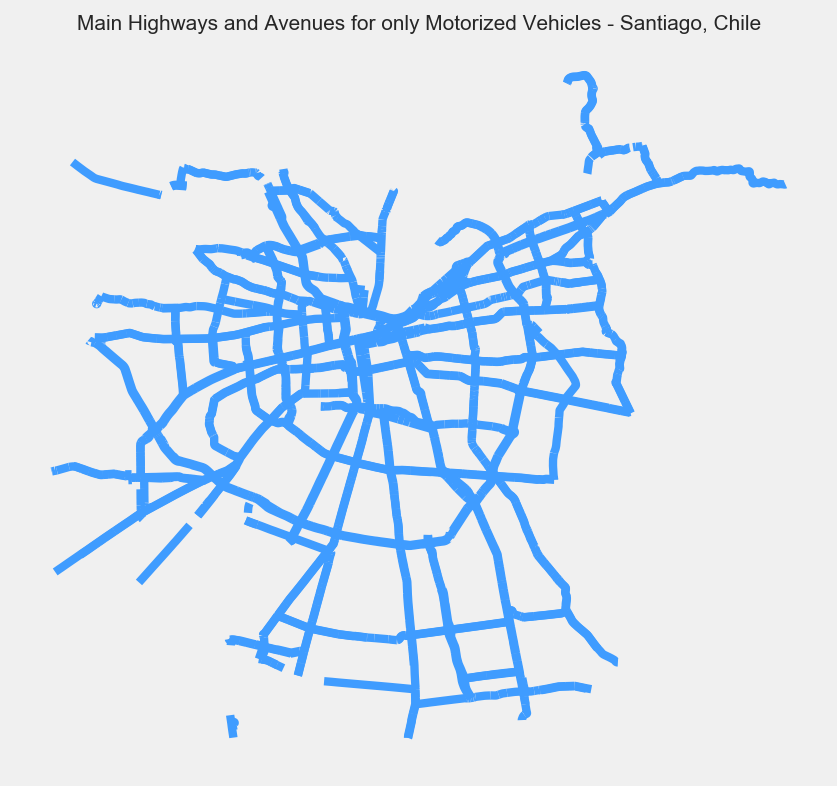

In [124]:
main_roads = car_roads[(car_roads["street type"] == 'primary')]
main_roads.plot(column='street type', color = '#3F9CFF', edgecolor='#444444')
plt.axis('off')
plt.title("Main Highways and Avenues for only Motorized Vehicles - Santiago, Chile", size= 10);

Now, let's see all the pedestrian streets. 

In [32]:
non_car_roads = streets_join_map[(streets_join_map["street type"] == "residential")|
                                   (streets_join_map["street type"] == "living_street") |
                                   (streets_join_map["street type"] == "footway")|
                                   (streets_join_map["street type"] == "pedestrian") |
                                   (streets_join_map["street type"] == "steps")|
                                   (streets_join_map["street type"] ==  "track")]

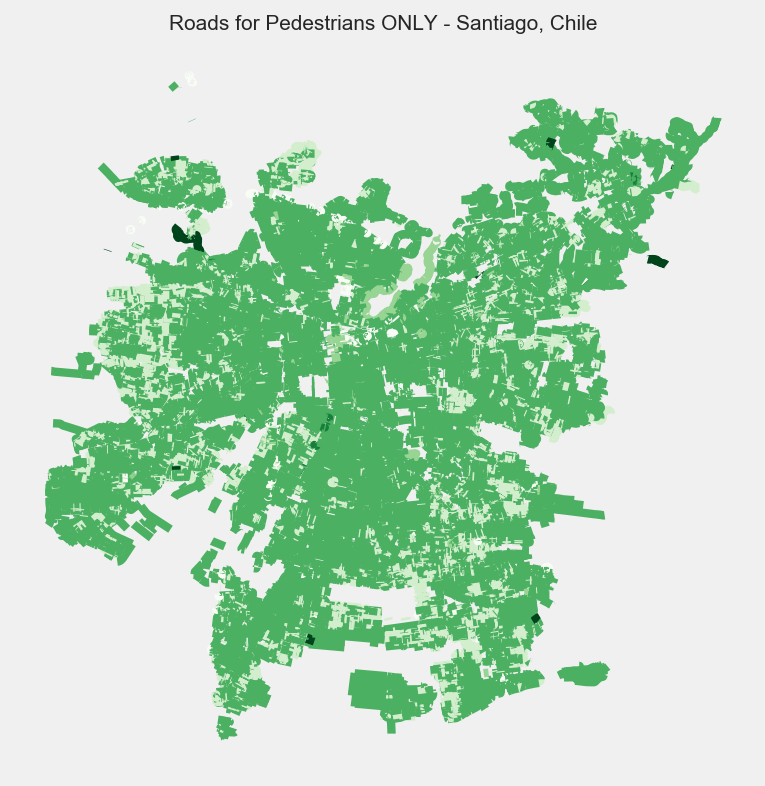

In [142]:
non_car_roads.plot(column='street type', cmap = 'Greens', edgecolor='#444444');
plt.axis('off');
plt.title("Roads for Pedestrians ONLY - Santiago, Chile", size= 10);

### Localize Run Overs in the Map

We join the run overs accidents by drivers and the santiago map.

In [34]:
runover_join_map = gpd.sjoin(run_over_santiago, santiago_map, op='intersects')

Show the accidents in terms of the main roads

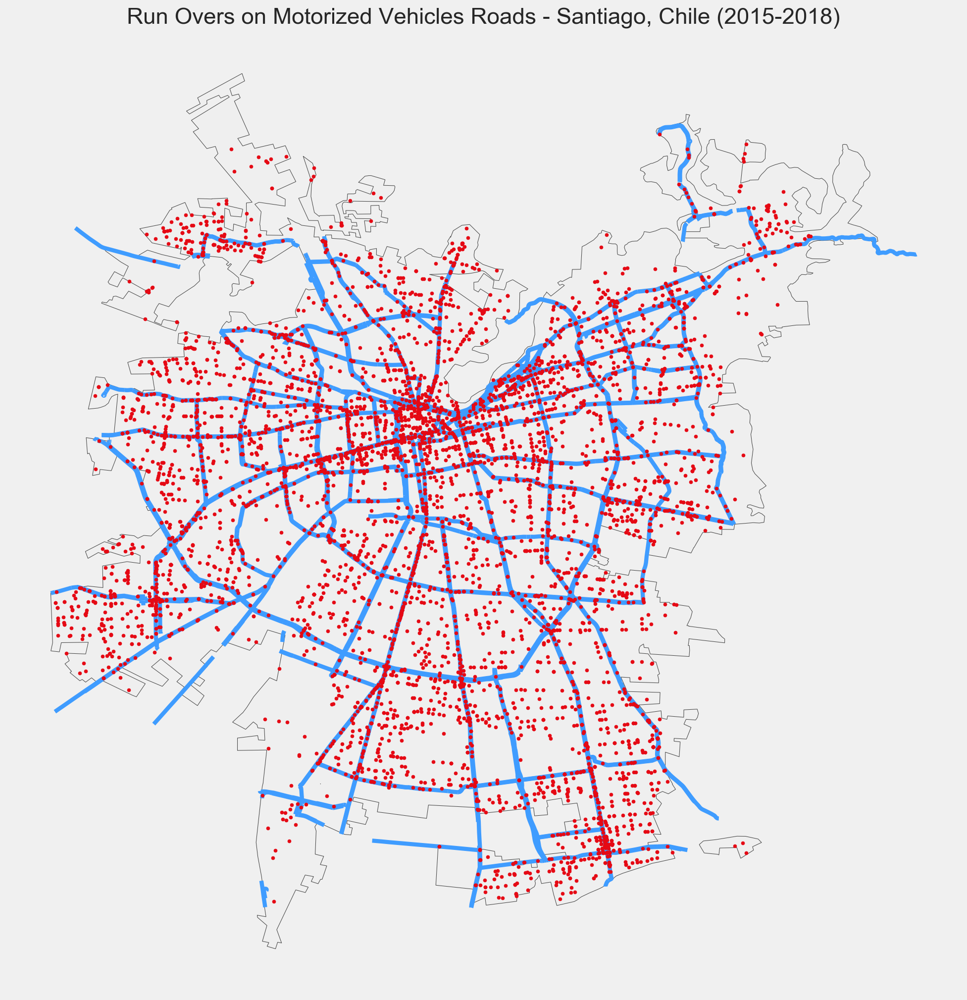

In [123]:
ax = santiago_map.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
main_roads.plot(ax=ax, color='#3F9CFF', markersize=1)
runover_join_map.plot(ax=ax, color='#e50914', markersize=10, zorder = 2)
plt.title("Run Overs on Motorized Vehicles Roads - Santiago, Chile (2015-2018)", size= 22)
plt.axis('off');

Show accidents in terms of non-vehicles roads. __Only pedestrian use.__

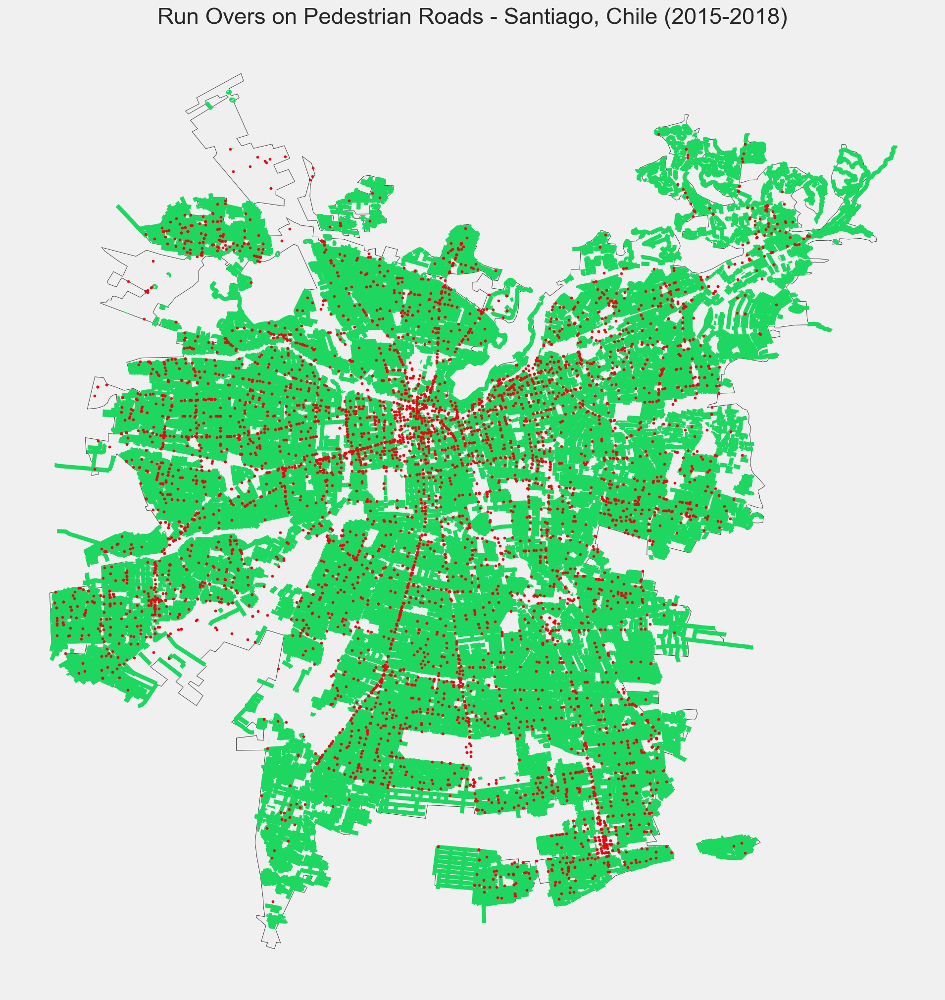

In [140]:
ax = santiago_map.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
non_car_roads.plot(ax=ax, color='#1ed760', markersize = 1)
runover_join_map.plot(ax=ax, color='#e50914',markersize=5, zorder=2)
plt.title("Run Overs on Pedestrian Roads - Santiago, Chile (2015-2018)", size = 22)
plt.axis('off');

From above plots we can start seeing a relationship between the main streets of Santiago and the number of Run over accidents. Let's see what happens with the Collision only portion of the CONASET dataset.

### Join Colisions with Santiago Maps


In [48]:
collison_join_map = gpd.sjoin(colisions_santiago, santiago_map, op='intersects')

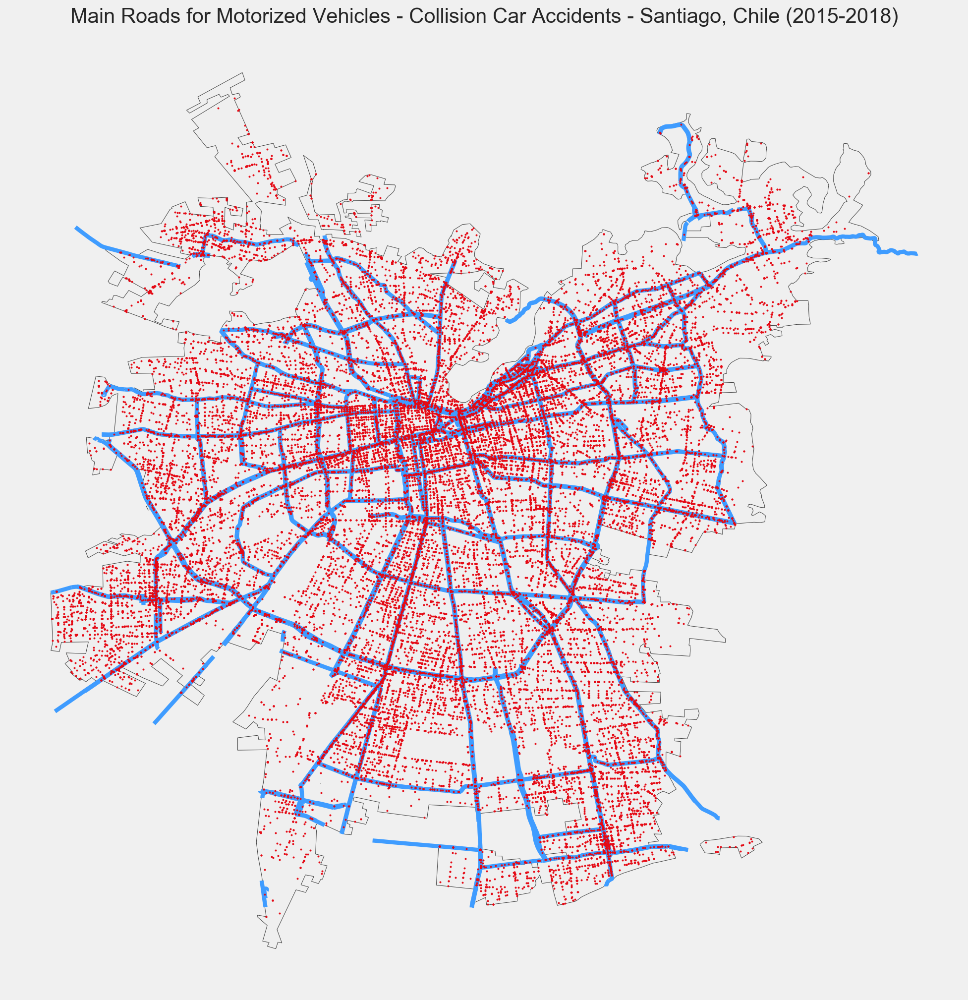

In [128]:
ax = santiago_map.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
main_roads.plot(ax=ax, color='#3F9CFF', markersize=1)
collison_join_map.plot(ax=ax, color='#e50914', markersize=2, zorder=2)
plt.title("Main Roads for Motorized Vehicles - Collision Car Accidents - Santiago, Chile (2015-2018)", size = 20)
plt.axis('off');

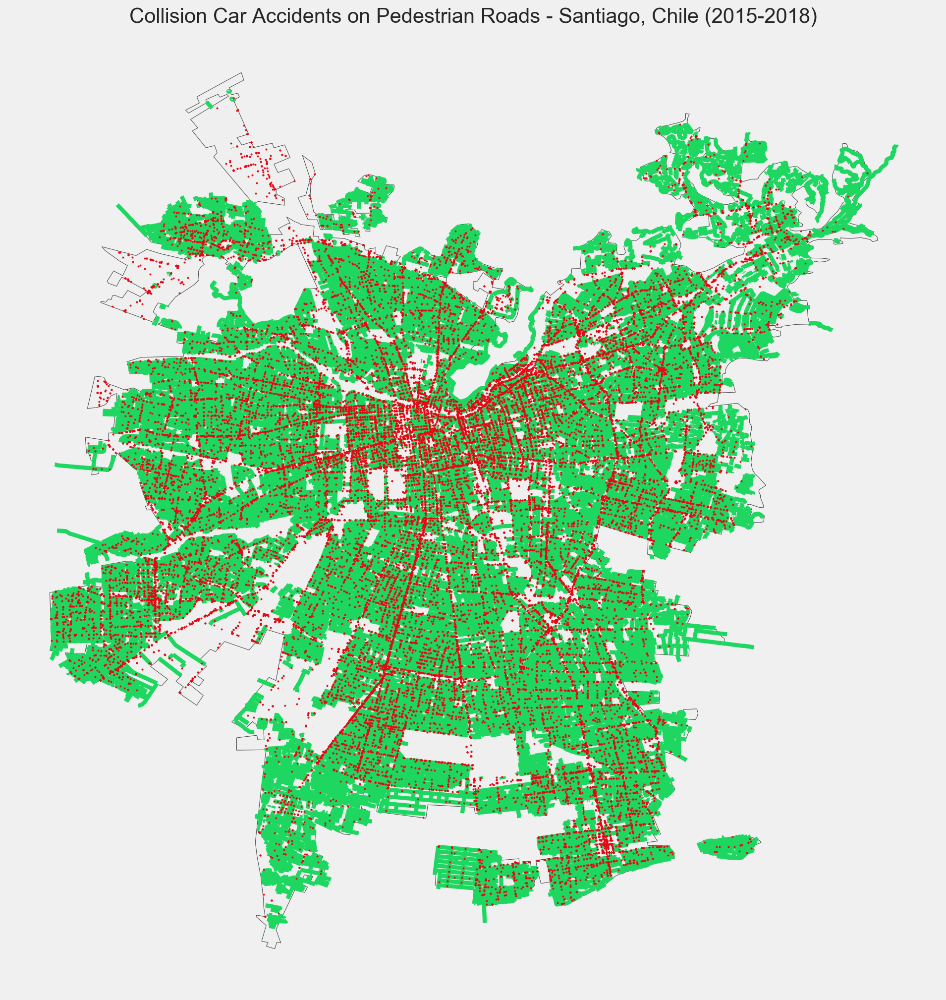

In [139]:
ax = santiago_map.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
non_car_roads.plot(ax=ax, color='#1ed760', markersize=1)
collison_join_map.plot(ax=ax, color='#e50914', markersize=2, zorder=2)
plt.title("Collision Car Accidents on Pedestrian Roads - Santiago, Chile (2015-2018)", size = 20)
plt.axis('off');

### Other accidents in the map

In [53]:
other_join_map = gpd.sjoin(other_santiago, santiago_map, op='intersects')

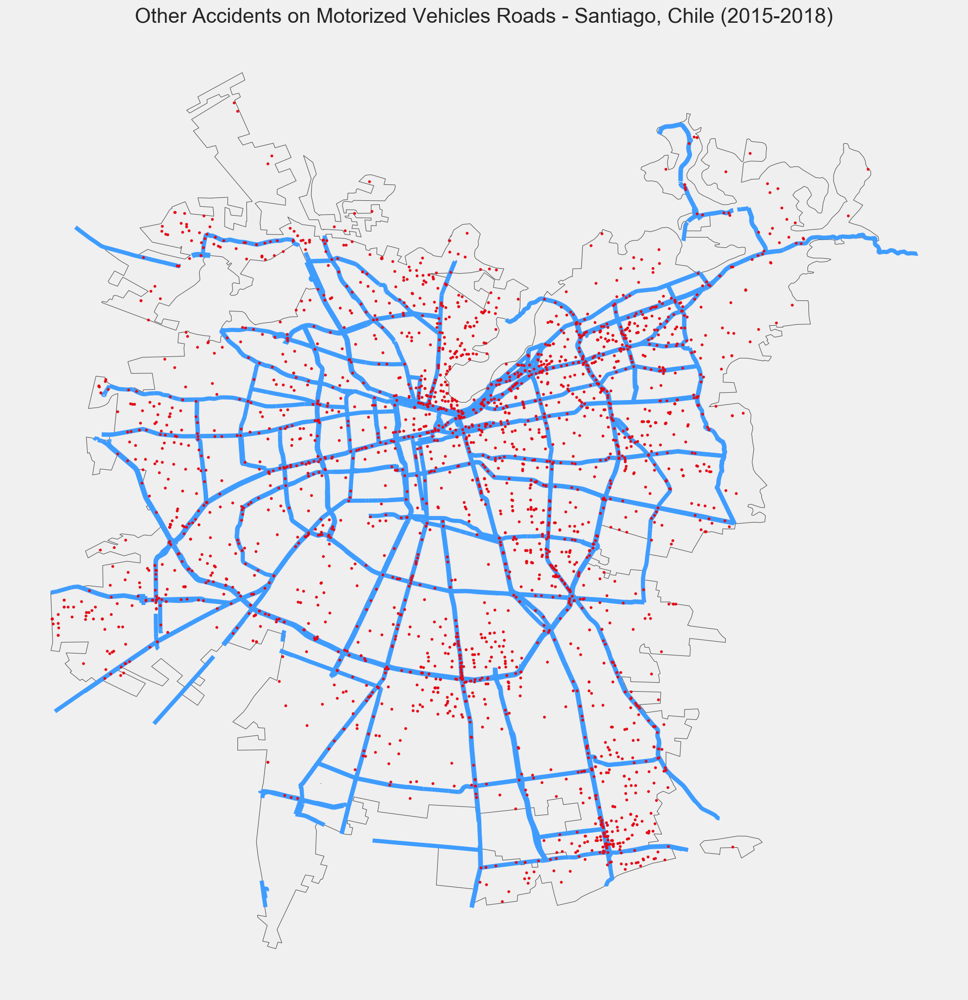

In [136]:
ax = santiago_map.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
main_roads.plot(ax=ax, color='#3F9CFF', markersize=1)
other_join_map.plot(ax=ax, color='#e50914', markersize=5, zorder=2)
plt.title("Other Accidents on Motorized Vehicles Roads - Santiago, Chile (2015-2018)", size = 20)
plt.axis('off');

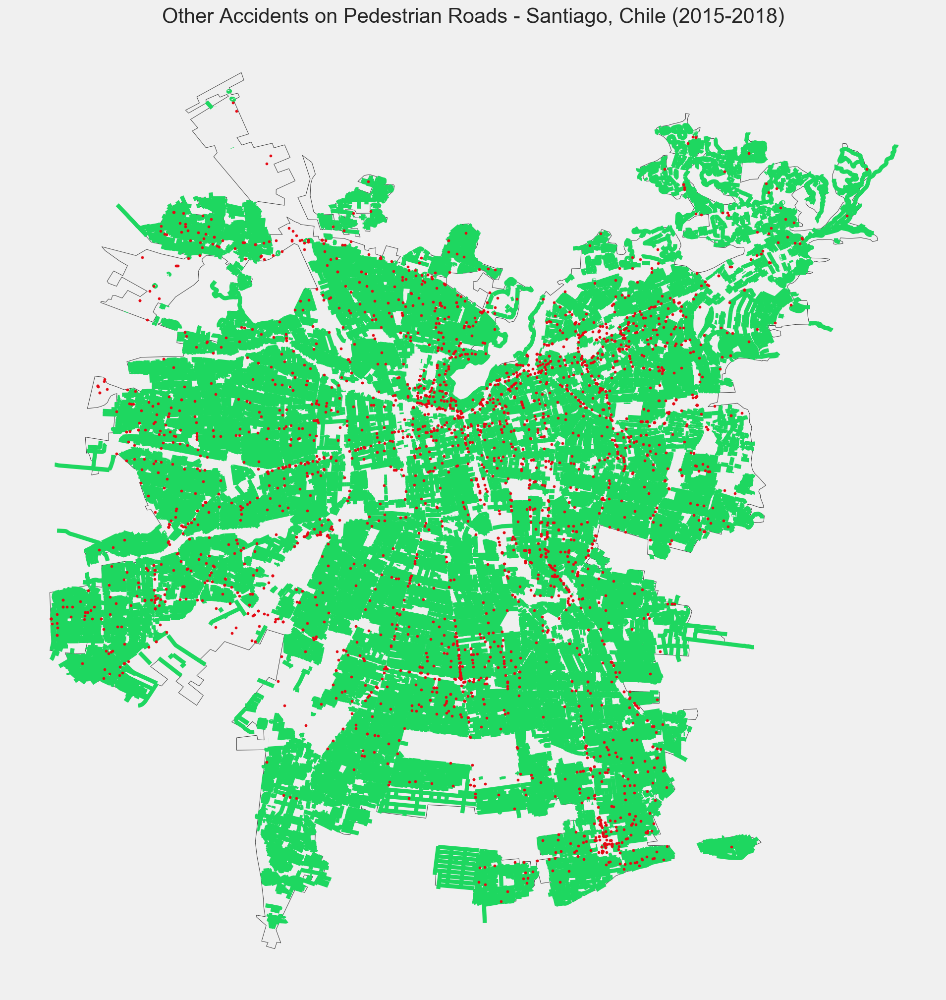

In [144]:
ax = santiago_map.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
non_car_roads.plot(ax=ax, color='#1ed760', markersize=1)
other_join_map.plot(ax=ax, color='#e50914', markersize=5, zorder=99)
plt.title("Other Accidents on Pedestrian Roads - Santiago, Chile (2015-2018)", size = 20)
plt.axis('off');

### Casualties

In [58]:
casualties_map = conaset_df[conaset_df["Death"] == 1]
casualties_map = gpd.sjoin(casualties_map, santiago_map, op='intersects')
all_accidents_map = gpd.sjoin(conaset_df, santiago_map, op ='intersects')

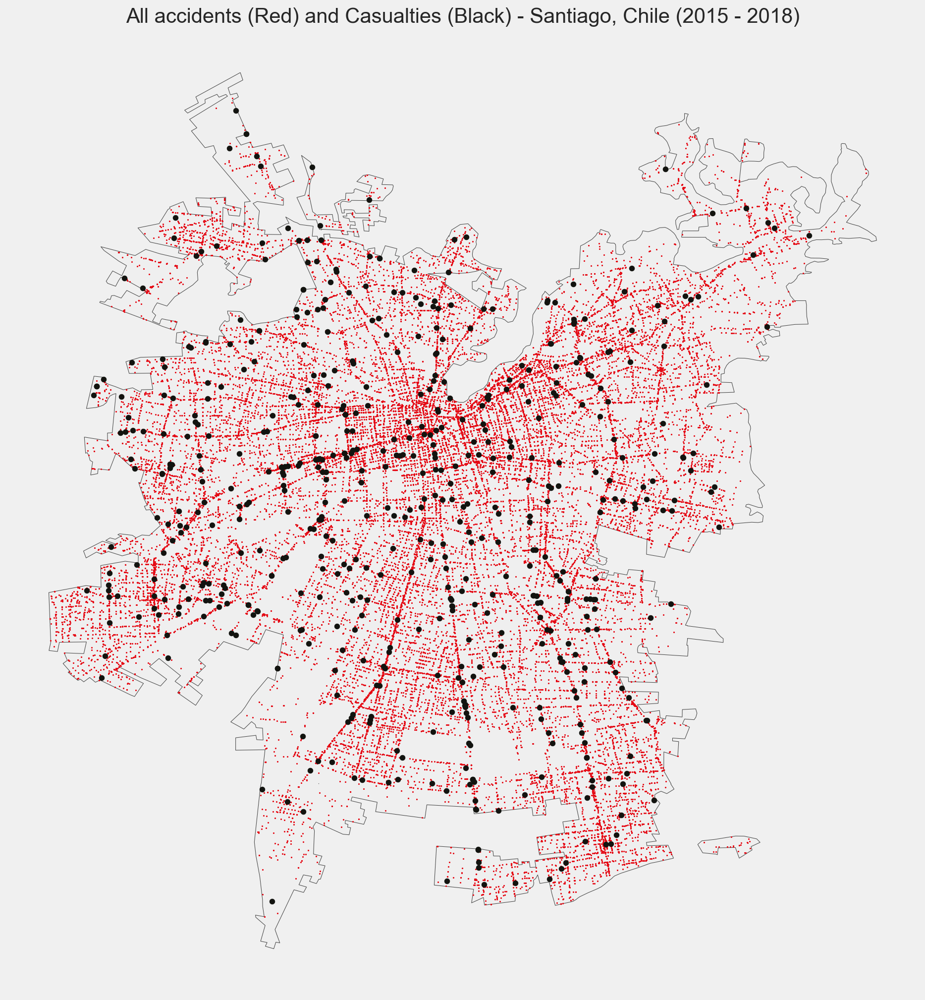

In [145]:
ax = santiago_map.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#444444')
all_accidents_map.plot(ax=ax, color='#e50914', markersize=1)
casualties_map.plot(ax=ax, color='#12130F',  markersize=25, zorder=2)
plt.title("All accidents (Red) and Casualties (Black) - Santiago, Chile (2015 - 2018)", size = 20)
plt.axis('off')
plt.savefig("./output/images/santiago_casualties.png");

***

## Percentages

In [63]:
dead_run_over = len(run_over_santiago[run_over_santiago["Deaths Quantity"] != 0]) / len(run_over_santiago)
survived_run_over = len(run_over_santiago[run_over_santiago["Deaths Quantity"] == 0]) / len(run_over_santiago)
print(f"percentage of dying in a run over:   {dead_run_over*100} %")
print(f"percentage of surviving a run over:  {survived_run_over*100}%")

percentage of dying in a run over:   4.525588608487241 %
percentage of surviving a run over:  95.47441139151276%


In [64]:
dead_colission = len(colisions_santiago[colisions_santiago["Deaths Quantity"] != 0]) / len(colisions_santiago)
survived_colission = len(colisions_santiago[colisions_santiago["Deaths Quantity"] == 0]) / len(colisions_santiago)
print(f"percentage of dying in a collision:    {dead_colission*100} %")
print(f"percentage of surviving a collision:  {survived_colission*100} %")

percentage of dying in a collision:    0.5089695452649144 %
percentage of surviving a collision:  99.49103045473508 %


In [65]:
dead_other = len(other_santiago[other_santiago["Deaths Quantity"] != 0]) / len(other_santiago)
survived_other = len(other_santiago[other_santiago["Deaths Quantity"] == 0]) / len(other_santiago)
print(f"percentage of dying in an other type of accident:   {dead_other*100} %")
print(f"percentage of surviving an other type of accident:  {survived_other*100} %")

percentage of dying in an other type of accident:   1.1750154607297465 %
percentage of surviving an other type of accident:  98.82498453927026 %


Although the GeoData gives us an impressive visualizations in terms of the three mentioned above type of accidents, their proportions do not differ significantly. 

From now on, we will be working with the entire accident dataset `conaset_df` (unless we specify by year, time, etc).

Let's look at the entire accident dataset's proportion.

In [66]:
dead_total = len(conaset_df[conaset_df["Deaths Quantity"] != 0]) / len(conaset_df)
survived_total = len(conaset_df[conaset_df["Deaths Quantity"] == 0]) / len(conaset_df)
print(f"percentage of dying in accidents:      {dead_total*100} %")
print(f"percentage of surviving in accidents:  {survived_total*100} %")

percentage of dying in accidents:      0.9298511404228111 %
percentage of surviving in accidents:  99.07014885957719 %


***

## Visualizations

We will explore the data using visualizations using the `Seaborn` library.

### Plots using Seaborn 

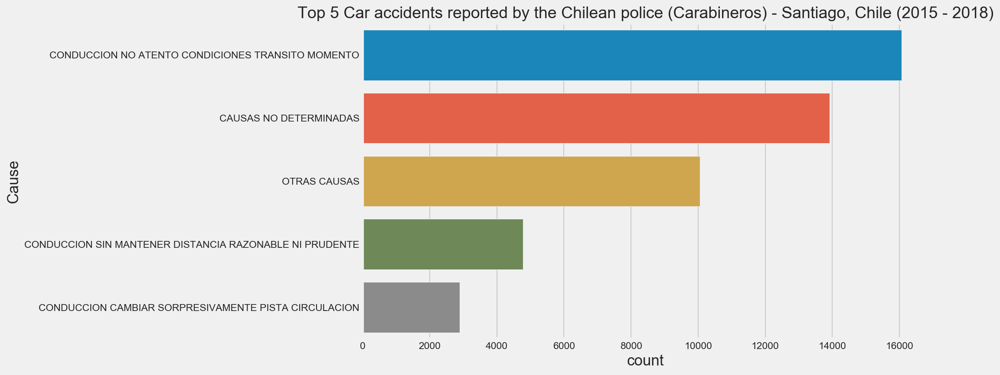

In [67]:
sns.countplot(data=conaset_df, y = "Cause", order = conaset_df["Cause"].value_counts().index[0:5,])
plt.title("Top 5 Car accidents reported by the Chilean police (Carabineros) - Santiago, Chile (2015 - 2018)", size= 18);

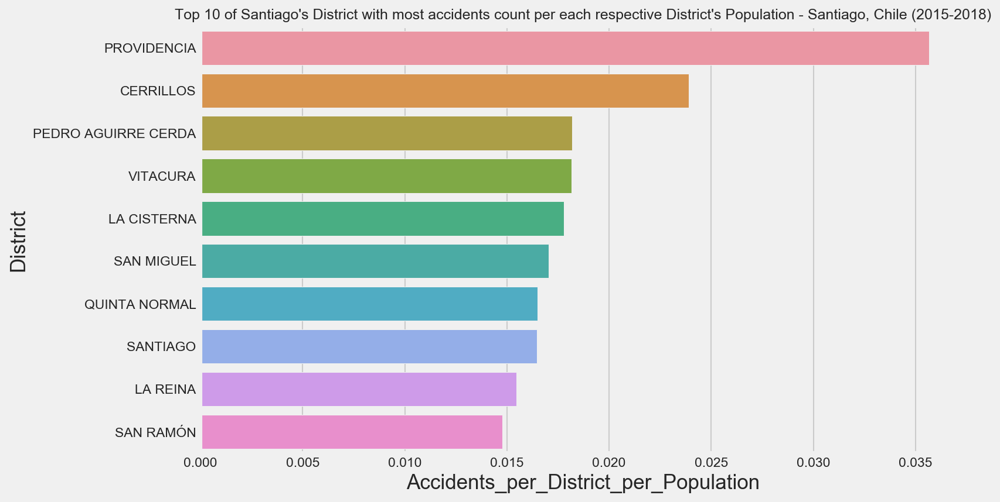

In [83]:
districts_top_10 = census["Accidents_per_District_Population"].sort_values(ascending = False).index[0:10,]
sns.barplot(x=conaset_df["Accidents_per_District_per_Population"], y=conaset_df["District"], order =districts_top_10 )
# sns.countplot(data=conaset_df, y = "District", order = conaset_df["District"].value_counts().index[0:10,])
plt.title("Top 10 of Santiago's District with most accidents count per each respective District's Population - Santiago, Chile (2015-2018)", size = 12);

In [74]:
census["Accidents_per_District_per_200000_People"].sort_values(ascending = False).index[0:10,]

Index(['SANTIAGO', 'PUENTE ALTO', 'MAIPÚ', 'PROVIDENCIA', 'LAS CONDES',
       'LA FLORIDA', 'NUNOA', 'EL BOSQUE', 'ESTACIÓN CENTRAL', 'PUDAHUEL'],
      dtype='object', name='District')

In [81]:
census["Accidents_per_District_per_200000_People"].sort_values(ascending = False).index[0:10,]

Index(['SANTIAGO', 'PUENTE ALTO', 'MAIPÚ', 'PROVIDENCIA', 'LAS CONDES',
       'LA FLORIDA', 'NUNOA', 'EL BOSQUE', 'ESTACIÓN CENTRAL', 'PUDAHUEL'],
      dtype='object', name='District')

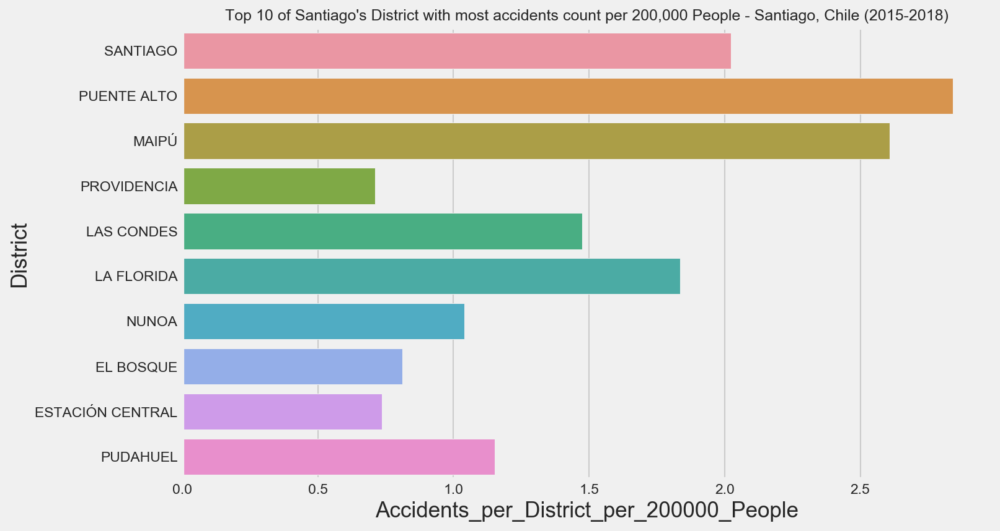

In [82]:
districts_top_10 = census["Accidents_per_District_per_200000_People"].sort_values(ascending = False).index[0:10,]
sns.barplot(x=conaset_df["Accidents_per_District_per_200000_People"], y=conaset_df["District"], order =districts_top_10 )
# sns.countplot(data=conaset_df, y = "District", order = conaset_df["District"].value_counts().index[0:10,])
plt.title("Top 10 of Santiago's District with most accidents count per 200,000 People - Santiago, Chile (2015-2018)", size = 12);

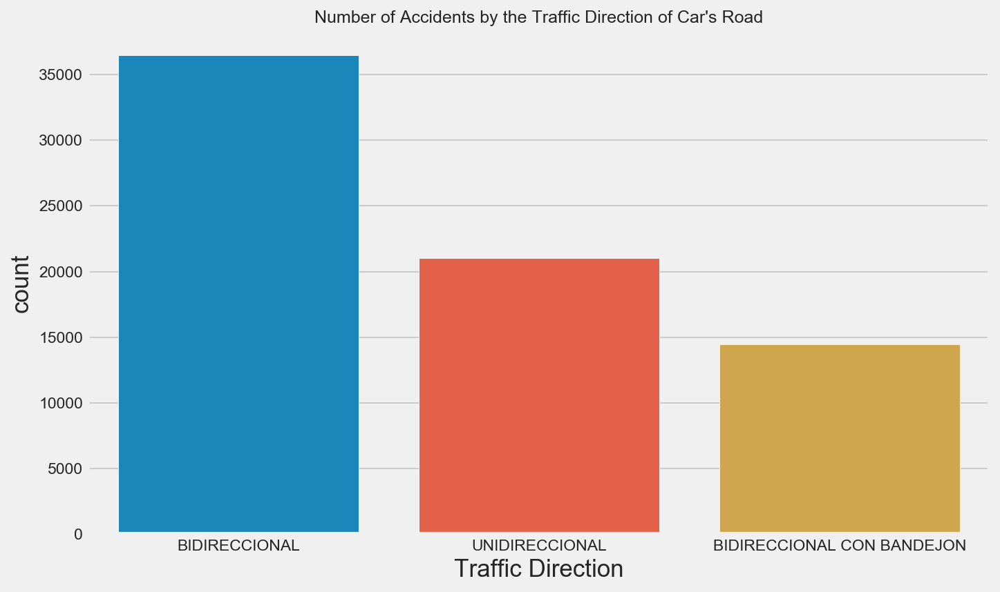

In [84]:
sns.countplot(data=conaset_df, x = "Road_Direction")
plt.title("Number of Accidents by the Traffic Direction of Car's Road", size = 12)
plt.xlabel("Traffic Direction");

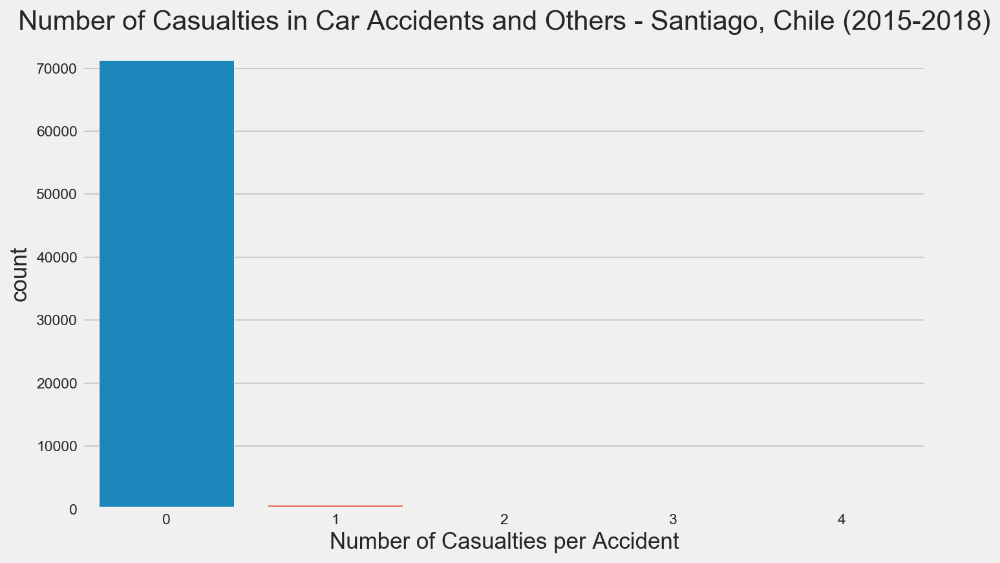

In [85]:
sns.countplot(data=conaset_df, x = "Deaths Quantity")
plt.title("Number of Casualties in Car Accidents and Others - Santiago, Chile (2015-2018)")
plt.xlabel("Number of Casualties per Accident");

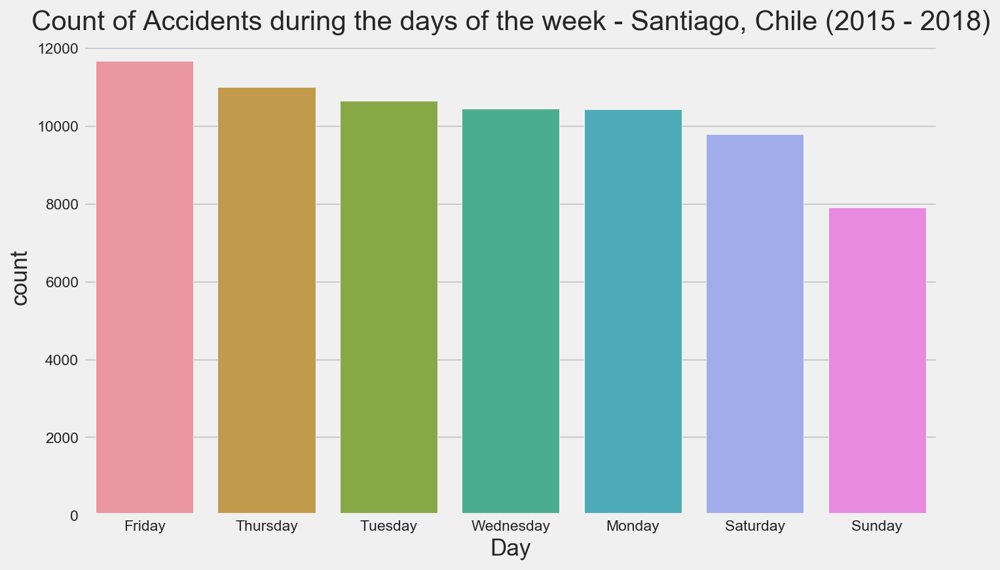

In [86]:
sns.countplot(data=conaset_df, x = "Day", order = conaset_df["Day"].value_counts().index)
plt.title("Count of Accidents during the days of the week - Santiago, Chile (2015 - 2018)");

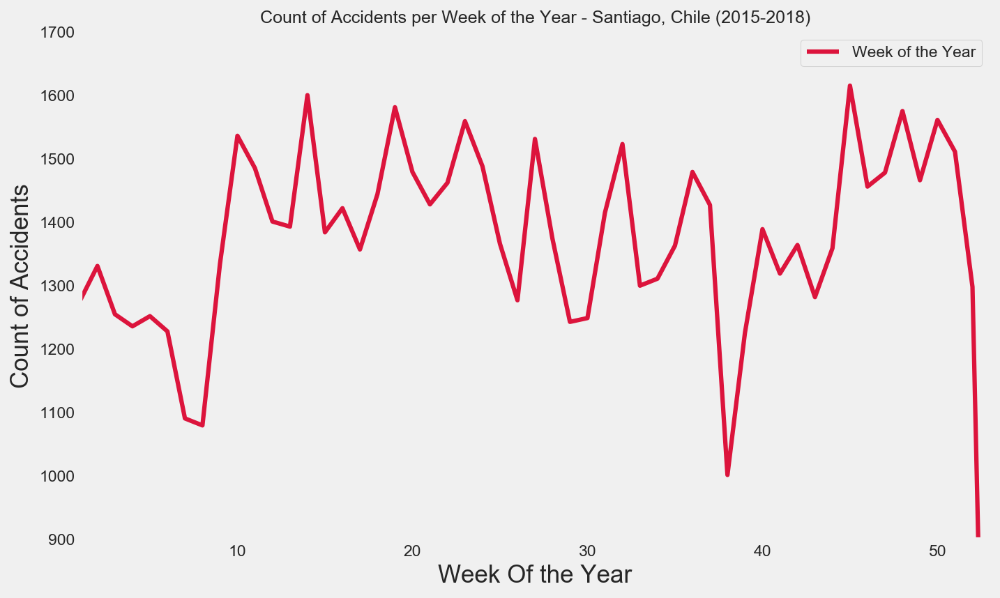

In [87]:
weeks_index = np.array(conaset_df["Week_of_Year"].value_counts().sort_index().index)
weeks_values = np.array(conaset_df["Week_of_Year"].value_counts().sort_index().values)
sns.lineplot(x = weeks_index,  y = weeks_values, label = "Week of the Year", color='crimson', lw= 3)
plt.xlabel("Week Of the Year")
plt.ylabel("Count of Accidents")
plt.ylim((900,1700))
plt.xlim((1,53))
plt.grid()
plt.title("Count of Accidents per Week of the Year - Santiago, Chile (2015-2018)", size = 12);

Here we see something very interesting in our dataset that might be very relevant for later results.

We see some drops in accident's count at:
- Nearly at the end of summer, where most people people leave the capital for vacations 
- At the week 38 is around mid September, where Chileans have the "Fiestas Patrias", which it can be translate as a national week off from work due to the independence process of the country from the Spanish Crown (1810-1818). This similar to the Spring Break in the United States, this break applies to students and most workers nationwide though.

However, we have one more and by the biggest drop in Accident counts during the last two weeks of the year. The natural question that comes up to the reader is that *are people not having accidents during Christmas and New Years?*. People have car accidents all the time, so clearly we cannot have that hypothesis.

I think in this plot we have found important data inputed wrong. In other words, for some reason the Conaset didn't not input the accident data for the last weeks of the year 2015-2018. 

Let's see if see the same problem below in another visualization.

In [88]:
season_df = conaset_df.groupby(["Season"]).count()[["Cause"]].rename(columns={"Cause": "Accident_Count"}).sort_values(by = "Accident_Count")
season_df

,Accident_Count
Season,
Summer,16999
Winter,17858
Spring,18092
Fall,18998


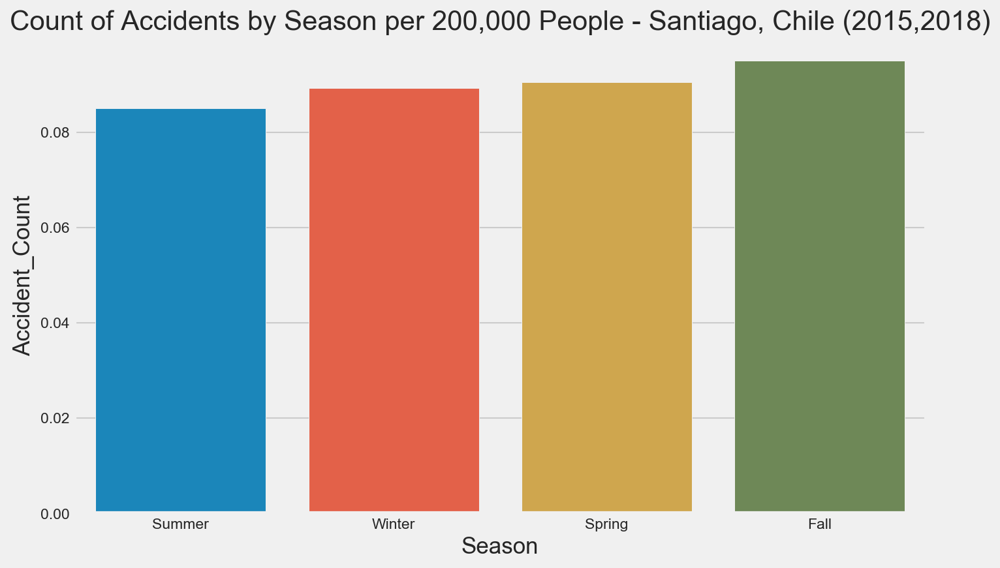

In [89]:
sorting = season_df.index
sns.barplot(x=season_df.index, y=season_df["Accident_Count"] / 200000, order =sorting )
plt.title("Count of Accidents by Season per 200,000 People - Santiago, Chile (2015,2018)");

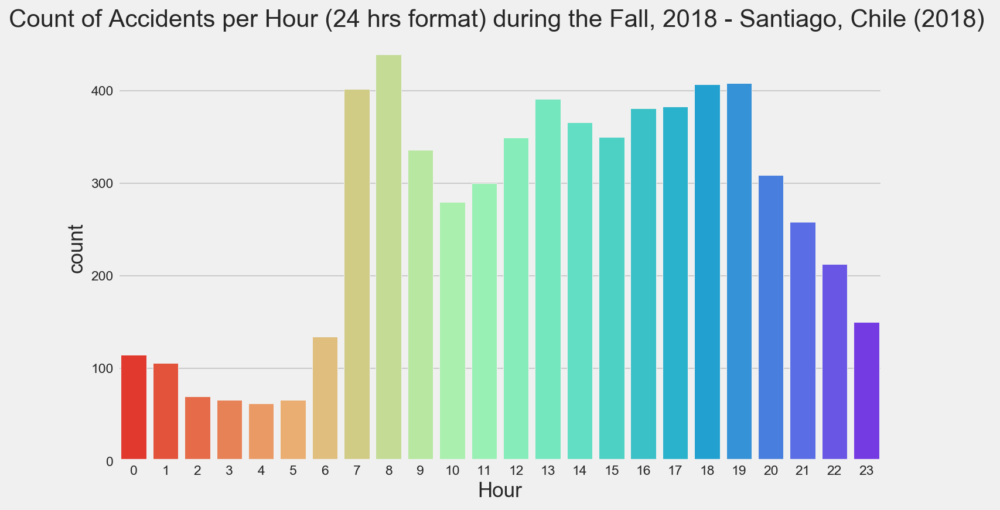

In [90]:
accidents_fall_2018 = conaset_df[(conaset_df["Year"] == 2018) & (conaset_df["Season"] == "Fall")]
sns.countplot(data=accidents_fall_2018, x = "Hour",palette="rainbow_r")
plt.title("Count of Accidents per Hour (24 hrs format) during the Fall, 2018 - Santiago, Chile (2018) ");

### Matrix Heatmaps


In [91]:
#Determine the number of accidents for each day of the week by month (combine years 2015-2018)
def RTAs_by_month(df, month):
    month_list = []
    mon, tues, wed, thurs, fri, sat, sun = 0,0,0,0,0,0,0
    
    for idx, row in df.iterrows():
        if row["Month"] == month and row["Day"] == "Monday": mon +=1
        elif row["Month"] == month and row["Day"] == "Tuesday": tues +=1
        elif row["Month"] == month and row["Day"] == "Wednesday": wed +=1
        elif row["Month"] == month and row["Day"] == "Thursday": thurs +=1
        elif row["Month"] == month and row["Day"] == "Friday": fri +=1
        elif row["Month"] == month and row["Day"] == "Saturday": sat +=1
        elif row["Month"] == month and row["Day"] == "Sunday": sun +=1
        else: a=0 

    month_list.append(mon)
    month_list.append(tues)
    month_list.append(wed)
    month_list.append(thurs)
    month_list.append(fri)
    month_list.append(sat)
    month_list.append(sun)
        
    return(month_list)

In [92]:
#Extract RTA data for each day by month
january = RTAs_by_month(conaset_df, "Jan")
february = RTAs_by_month(conaset_df, "Feb")
march = RTAs_by_month(conaset_df, "Mar")
april = RTAs_by_month(conaset_df, "Apr")
may = RTAs_by_month(conaset_df, "May")
june = RTAs_by_month(conaset_df, "Jun")
july = RTAs_by_month(conaset_df, "Jul")
august = RTAs_by_month(conaset_df, "Aug")
september = RTAs_by_month(conaset_df, "Sep")
october = RTAs_by_month(conaset_df, "Oct")
november = RTAs_by_month(conaset_df, "Nov")
december = RTAs_by_month(conaset_df, "Dec")

In [93]:
#Create matrix for the heatmap
colmns = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
rows = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
data = np.array([january, february, march, april, may, june, july, august, september, october, november, december])
heatmap_df = pd.DataFrame(data=data, index=rows, columns=colmns)
heatmap_df.head()

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
January,874,830,815,717,885,712,619
February,766,669,666,681,733,632,544
March,911,930,1024,1111,1048,831,603
April,902,955,789,934,1025,866,703
May,937,1065,943,1019,983,887,652


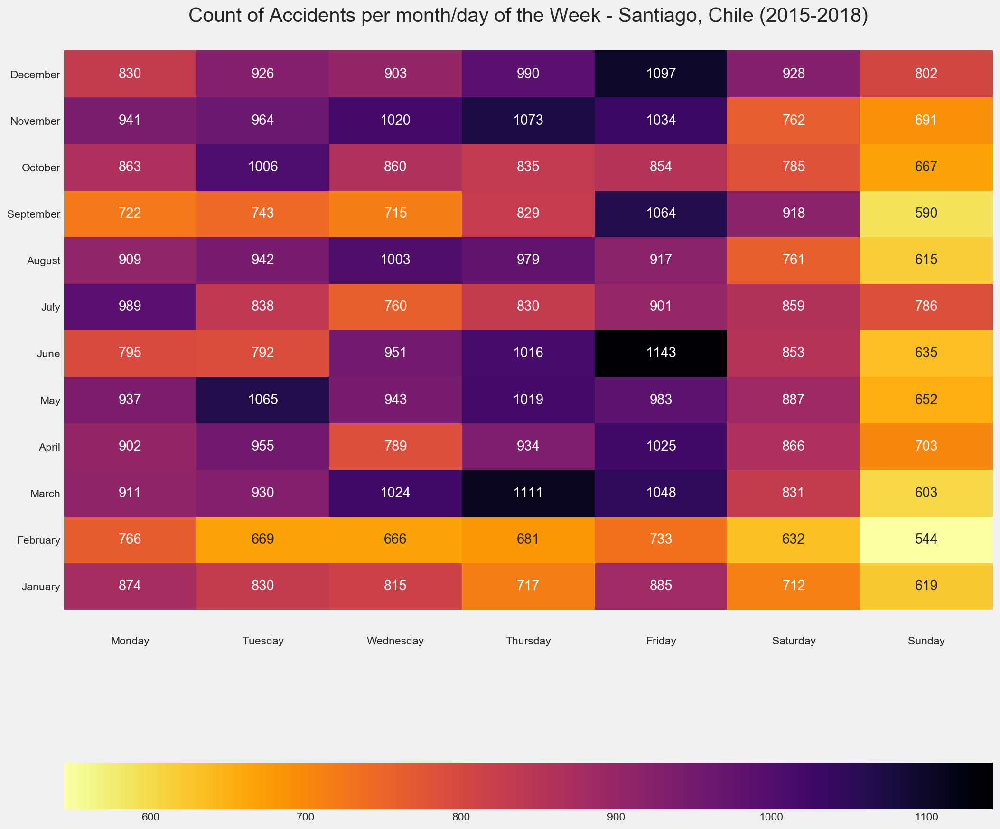

In [94]:
plt.figure(figsize=(15,15))
ax = sns.heatmap(heatmap_df, annot=True, fmt="d", cmap='inferno_r' , cbar_kws={"orientation": "horizontal"} ,xticklabels=True, yticklabels=True)
plt.title("Count of Accidents per month/day of the Week - Santiago, Chile (2015-2018)")
ax.set_ylim(-0.5,len(data)+0.5)
plt.yticks(rotation = 0)
plt.show();

In [95]:
#Function to determine number of accidents for each hour per day
def RTAs_by_hour(df, hour):
    hour_list = []
    mon, tues, wed, thurs, fri, sat, sun = 0,0,0,0,0,0,0
    
    for idx, row in df.iterrows():
        if row["Hour"] == hour and row["Day"] == "Monday": mon +=1
        elif row["Hour"] == hour and row["Day"] == "Tuesday": tues +=1
        elif row["Hour"] == hour and row["Day"] == "Wednesday": wed +=1
        elif row["Hour"] == hour and row["Day"] == "Thursday": thurs +=1
        elif row["Hour"] == hour and row["Day"] == "Friday": fri +=1
        elif row["Hour"] == hour and row["Day"] == "Saturday": sat +=1
        elif row["Hour"] == hour and row["Day"] == "Sunday": sun +=1
        else: a=0 

    hour_list.append(mon)
    hour_list.append(tues)
    hour_list.append(wed)
    hour_list.append(thurs)
    hour_list.append(fri)
    hour_list.append(sat)
    hour_list.append(sun)
    

    
    return(hour_list)

In [96]:
accidents_fall_2018 = conaset_df[(conaset_df["Year"] == 2018) & (conaset_df["Season"] == "Fall")]
hour_0 = RTAs_by_hour(accidents_fall_2018, 0)
hour_1 = RTAs_by_hour(accidents_fall_2018, 1)
hour_2 = RTAs_by_hour(accidents_fall_2018, 2)
hour_3 = RTAs_by_hour(accidents_fall_2018, 3)
hour_4 = RTAs_by_hour(accidents_fall_2018, 4)
hour_5 = RTAs_by_hour(accidents_fall_2018, 5)
hour_6 = RTAs_by_hour(accidents_fall_2018, 6)
hour_7 = RTAs_by_hour(accidents_fall_2018, 7)
hour_8 = RTAs_by_hour(accidents_fall_2018, 8)
hour_9 = RTAs_by_hour(accidents_fall_2018, 9)
hour_10 = RTAs_by_hour(accidents_fall_2018, 10)
hour_11 = RTAs_by_hour(accidents_fall_2018, 11)
hour_12 = RTAs_by_hour(accidents_fall_2018, 12)
hour_13 = RTAs_by_hour(accidents_fall_2018, 13)
hour_14 = RTAs_by_hour(accidents_fall_2018, 14)
hour_15 = RTAs_by_hour(accidents_fall_2018, 15)
hour_16 = RTAs_by_hour(accidents_fall_2018, 16)
hour_17 = RTAs_by_hour(accidents_fall_2018, 17)
hour_18 = RTAs_by_hour(accidents_fall_2018, 18)
hour_19 = RTAs_by_hour(accidents_fall_2018, 19)
hour_20 = RTAs_by_hour(accidents_fall_2018, 20)
hour_21 = RTAs_by_hour(accidents_fall_2018, 21)
hour_22 = RTAs_by_hour(accidents_fall_2018, 22)
hour_23 = RTAs_by_hour(accidents_fall_2018, 23)

In [97]:
#Create matrix for the heatmap
columns = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
rows = ["0am", "1am", "2am", "3am", "4am", "5am", "6am", "7am", "8am", "9am", "10am", "11am", "12pm", "1pm", "2pm", "3pm","4pm","5pm","6pm","7pm","8pm","9pm","10pm","11pm"]
data = np.array([hour_0, hour_1, hour_2, hour_3, hour_4, hour_5, hour_6, hour_7, hour_8, hour_9, hour_10, hour_11, hour_12, hour_13, hour_14, hour_15, hour_16, hour_17, hour_18, hour_19, hour_20, hour_21, hour_22, hour_23])
heatmap_hour_fall = pd.DataFrame(data=data, index=rows, columns=columns)
heatmap_hour_fall.head(2)

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
0am,14,15,11,17,20,18,20
1am,8,11,13,9,12,20,33


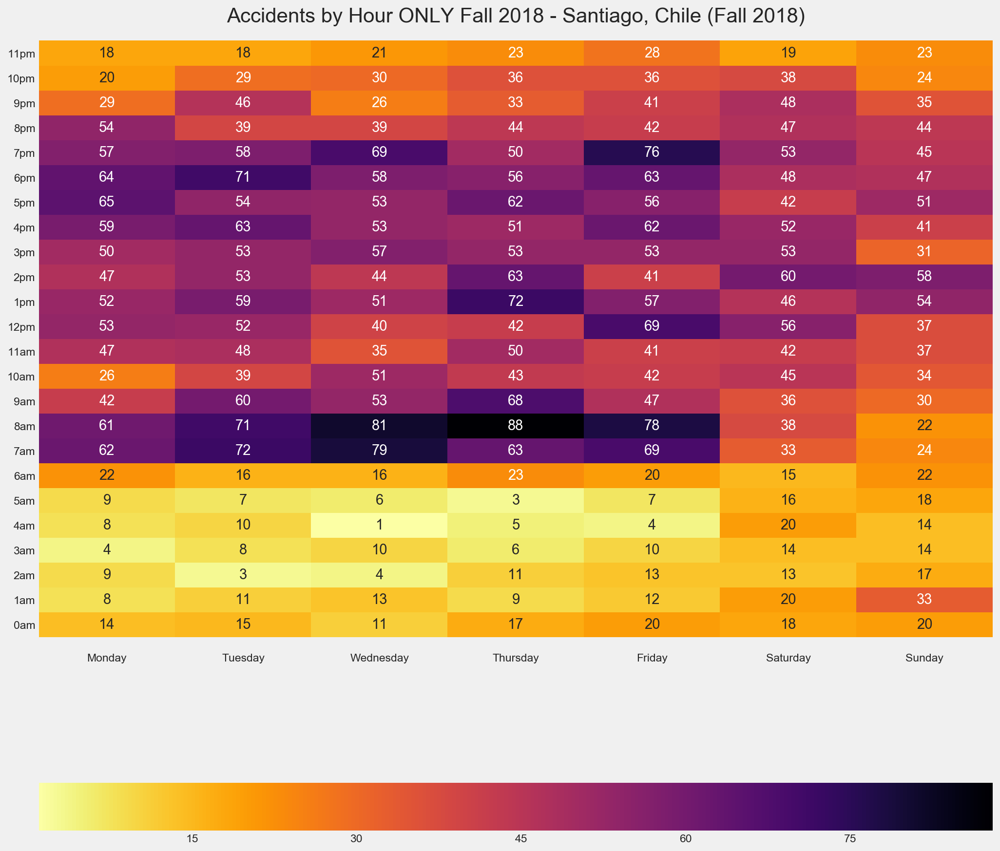

In [98]:
plt.figure(figsize=(15,15))
ax = sns.heatmap(heatmap_hour_fall, annot=True, fmt="d", cmap='inferno_r' , cbar_kws={"orientation": "horizontal"} ,xticklabels=True, yticklabels=True)
plt.title("Accidents by Hour ONLY Fall 2018 - Santiago, Chile (Fall 2018)")
ax.set_ylim(-0.5,len(data)+0.5)
plt.yticks(rotation = 0)
plt.show();

In [99]:
accidents_only_2018 = conaset_df[(conaset_df["Year"] == 2018)]
hour_0 = RTAs_by_hour(accidents_only_2018, 0)
hour_1 = RTAs_by_hour(accidents_only_2018, 1)
hour_2 = RTAs_by_hour(accidents_only_2018, 2)
hour_3 = RTAs_by_hour(accidents_only_2018, 3)
hour_4 = RTAs_by_hour(accidents_only_2018, 4)
hour_5 = RTAs_by_hour(accidents_only_2018, 5)
hour_6 = RTAs_by_hour(accidents_only_2018, 6)
hour_7 = RTAs_by_hour(accidents_only_2018, 7)
hour_8 = RTAs_by_hour(accidents_only_2018, 8)
hour_9 = RTAs_by_hour(accidents_only_2018, 9)
hour_10 = RTAs_by_hour(accidents_only_2018, 10)
hour_11 = RTAs_by_hour(accidents_only_2018, 11)
hour_12 = RTAs_by_hour(accidents_only_2018, 12)
hour_13 = RTAs_by_hour(accidents_only_2018, 13)
hour_14 = RTAs_by_hour(accidents_only_2018, 14)
hour_15 = RTAs_by_hour(accidents_only_2018, 15)
hour_16 = RTAs_by_hour(accidents_only_2018, 16)
hour_17 = RTAs_by_hour(accidents_only_2018, 17)
hour_18 = RTAs_by_hour(accidents_only_2018, 18)
hour_19 = RTAs_by_hour(accidents_only_2018, 19)
hour_20 = RTAs_by_hour(accidents_only_2018, 20)
hour_21 = RTAs_by_hour(accidents_only_2018, 21)
hour_22 = RTAs_by_hour(accidents_only_2018, 22)
hour_23 = RTAs_by_hour(accidents_only_2018, 23)

In [100]:
#Create matrix for the heatmap
columns = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
rows = ["0am", "1am", "2am", "3am", "4am", "5am", "6am", "7am", "8am", "9am", "10am", "11am", "12pm", "1pm", "2pm", "3pm","4pm","5pm","6pm","7pm","8pm","9pm","10pm","11pm"]
data = np.array([hour_0, hour_1, hour_2, hour_3, hour_4, hour_5, hour_6, hour_7, hour_8, hour_9, hour_10, hour_11, hour_12, hour_13, hour_14, hour_15, hour_16, hour_17, hour_18, hour_19, hour_20, hour_21, hour_22, hour_23])
heatmap_hour = pd.DataFrame(data=data, index=rows, columns=columns)
heatmap_hour.head(2)

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
0am,76,70,56,63,73,76,81
1am,39,45,32,42,49,74,86


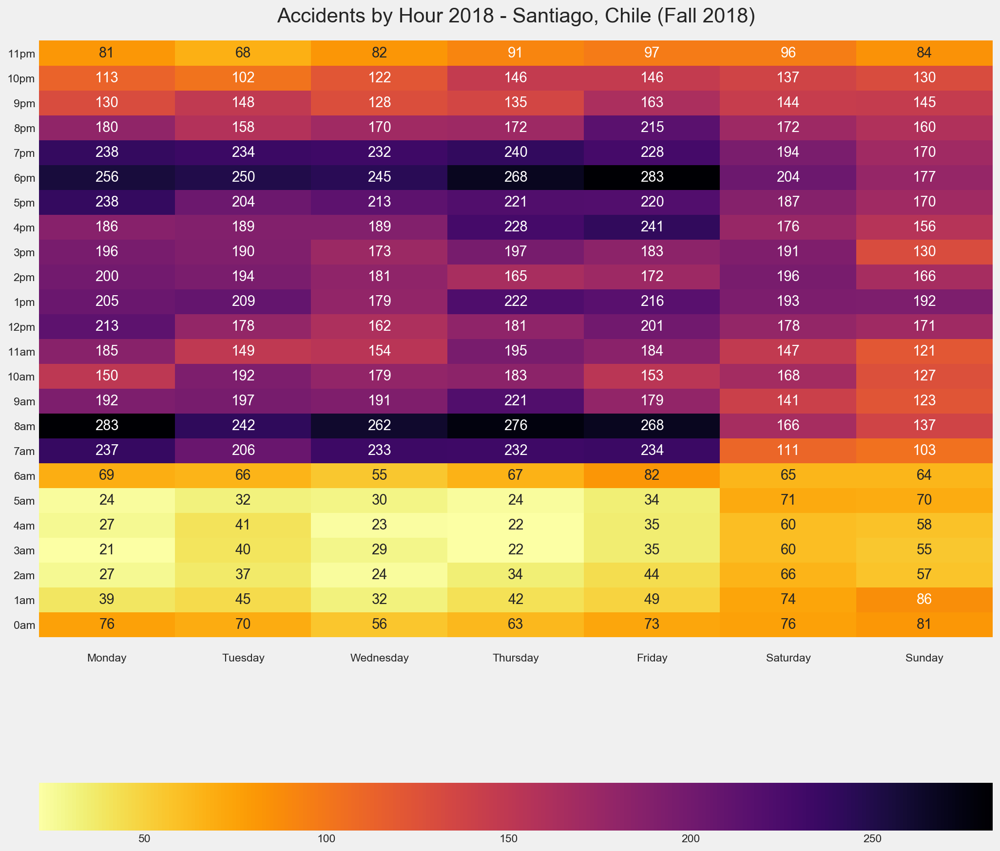

In [101]:
plt.figure(figsize=(15,15))
ax = sns.heatmap(heatmap_hour, annot=True, fmt="d", cmap='inferno_r' , cbar_kws={"orientation": "horizontal"} ,xticklabels=True, yticklabels=True)
plt.title("Accidents by Hour 2018 - Santiago, Chile (Fall 2018)")
ax.set_ylim(-0.5,len(data)+0.5)
plt.yticks(rotation = 0)
plt.show();

In [102]:
#Function to determine number of accidents for per Season of year (2015-2018)

def RTAs_by_season(df, season):
    season_list = []
    mon, tues, wed, thurs, fri, sat, sun = 0,0,0,0,0,0,0
    
    for idx, row in df.iterrows():
        if row["Season"] == season and row["Day"] == "Monday": mon +=1
        elif row["Season"] == season and row["Day"] == "Tuesday": tues +=1
        elif row["Season"] == season and row["Day"] == "Wednesday": wed +=1
        elif row["Season"] == season and row["Day"] == "Thursday": thurs +=1
        elif row["Season"] == season and row["Day"] == "Friday": fri +=1
        elif row["Season"] == season and row["Day"] == "Saturday": sat +=1
        elif row["Season"] == season and row["Day"] == "Sunday": sun +=1
        else: a=0 

    season_list.append(mon)
    season_list.append(tues)
    season_list.append(wed)
    season_list.append(thurs)
    season_list.append(fri)
    season_list.append(sat)
    season_list.append(sun)
        
    return(season_list)

In [103]:
fall = RTAs_by_season(conaset_df, "Fall")
summer = RTAs_by_season(conaset_df, "Summer")
winter = RTAs_by_season(conaset_df, "Winter")
spring = RTAs_by_season(conaset_df, "Spring")

In [104]:
#Create matrix for the heatmap
colmns = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
rows = ["Summer", "Fall", "Winter", "Spring"]
data = np.array([summer, fall, winter, spring])
heatmap_season = pd.DataFrame(data=data, index=rows, columns=colmns)
heatmap_season.head(2)

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Summer,2504,2415,2458,2566,2851,2305,1900
Fall,2731,2879,2713,2988,3066,2622,1999


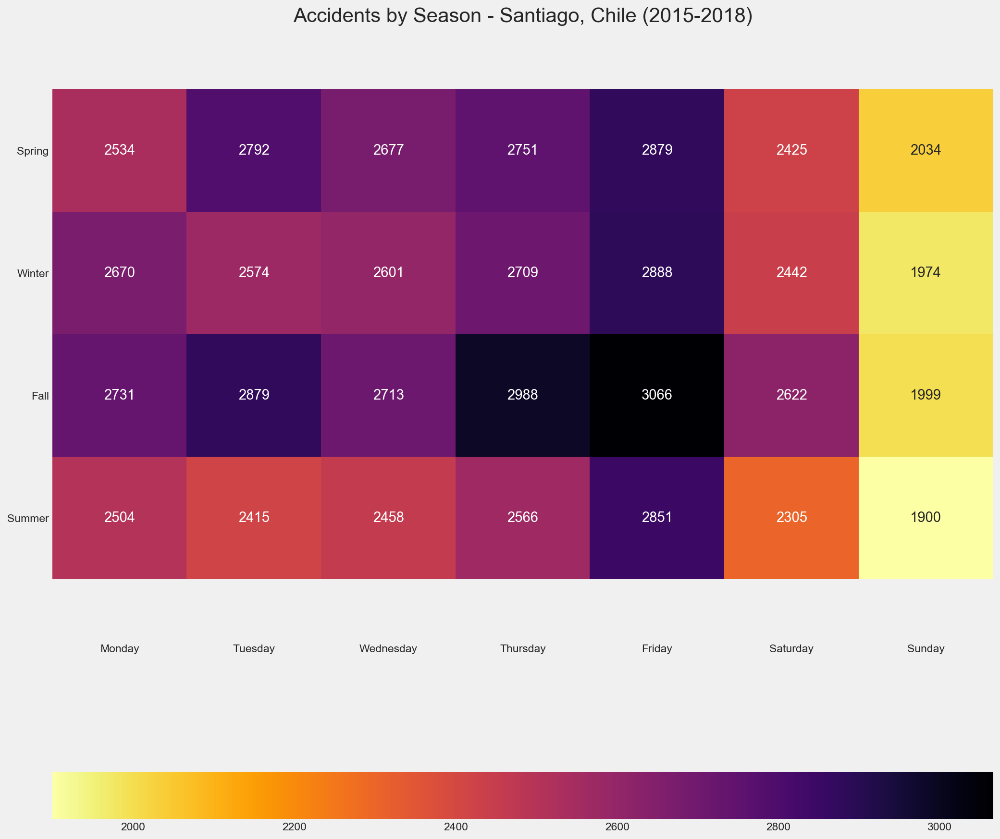

In [105]:
plt.figure(figsize=(15,15))
ax = sns.heatmap(heatmap_season, annot=True, fmt="d", cmap='inferno_r' , cbar_kws={"orientation": "horizontal"} ,xticklabels=True, yticklabels=True)
plt.title("Accidents by Season - Santiago, Chile (2015-2018)")
ax.set_ylim(-0.5,len(data)+0.5)
plt.yticks(rotation = 0)
plt.show();

In [106]:
#Function to determine number of accidents for each day of the week

def RTAs_by_week(df, target):
    arr = []
    mon, tues, wed, thurs, fri, sat, sun = 0,0,0,0,0,0,0
    
    for idx, row in df.iterrows():
        if row["Week_of_Year"] == target and row["Day"] == "Monday": mon +=1
        elif row["Week_of_Year"] == target and row["Day"] == "Tuesday": tues +=1
        elif row["Week_of_Year"] == target and row["Day"] == "Wednesday": wed +=1
        elif row["Week_of_Year"] == target and row["Day"] == "Thursday": thurs +=1
        elif row["Week_of_Year"] == target and row["Day"] == "Friday": fri +=1
        elif row["Week_of_Year"] == target and row["Day"] == "Saturday": sat +=1
        elif row["Week_of_Year"] == target and row["Day"] == "Sunday": sun +=1
        else: a=0 

    arr.append(mon)
    arr.append(tues)
    arr.append(wed)
    arr.append(thurs)
    arr.append(fri)
    arr.append(sat)
    arr.append(sun)
        
    return(arr)

In [107]:
columns = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
rows = []
for i in range(53):
    rows.append("Week " + str(i+1))
data = []
for e in range(53):
    data.append(RTAs_by_week(conaset_df, e+1))
heatmap_week = pd.DataFrame(data=data, index=rows, columns=columns)
heatmap_week.head(2)

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
Week 1,188,180,179,172,199,206,152
Week 2,217,174,226,163,254,177,120


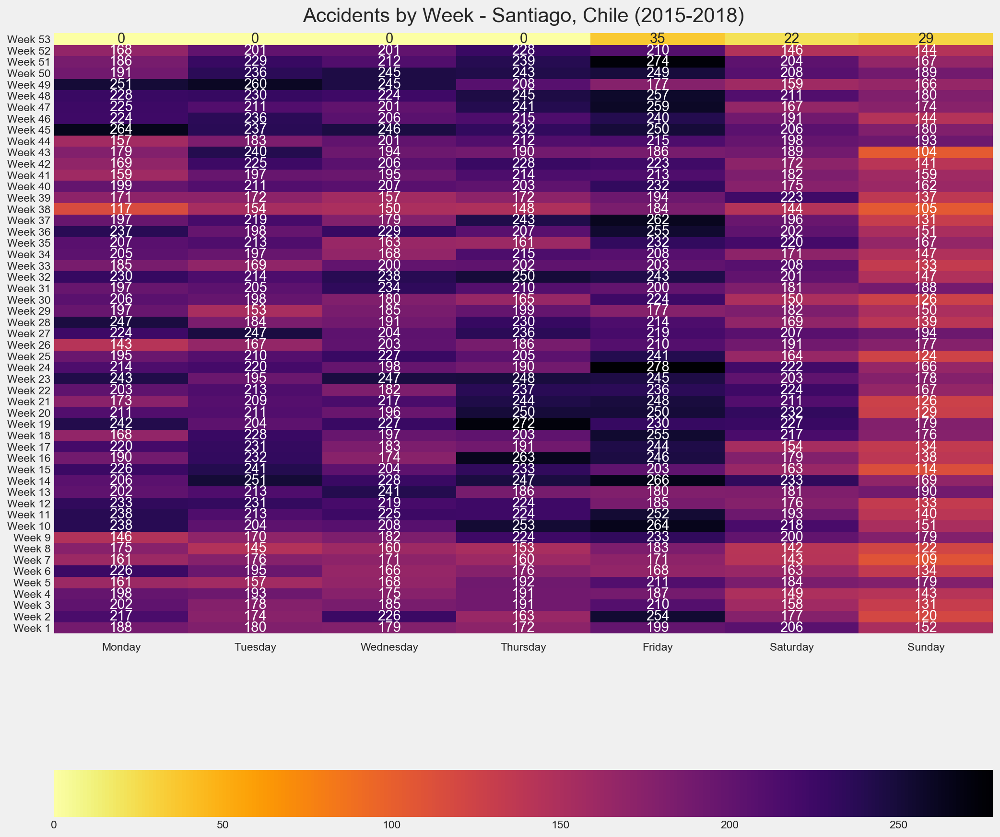

In [108]:
plt.figure(figsize=(15,15))
ax = sns.heatmap(heatmap_week, annot=True, fmt="d", cmap='inferno_r' , cbar_kws={"orientation": "horizontal"} ,xticklabels=True, yticklabels=True)
plt.title("Accidents by Week - Santiago, Chile (2015-2018)")
ax.set_ylim(-0.5,len(data)+0.5)
plt.yticks(rotation = 0)
plt.show();

***

## Supervised learning Analysis

Now we will proceed to __classify what are the major hot spots when people lose their lives by engaging in car accidents based on the CONASET data registered by the Chilean Carabineros__.

During the Data 100 Fall 2019 class, we learned about different tools that we can use to solve data related problems. For this project we decided to use a __Supervised Learning models__ to classify the most important features of our dataset. In other words, our machine learning model is learned from the pair of input and output objects relationship.

For the upcoming problems we will split the data into training and test data. The split of the data will act as the mapping of the input and output objects, the different types of algortihms we use will try to understand their relationship in order to predict our desired outcome.

Our target for this project is to know that __based on the car accidents data collected by the Chilean government, is it possible to predict if people would die or not? What are the most important features that support our predictions? How good is our model to differentiate among features when we are predicting if people are losing their lives or not during car accidents?__

For our target variable, we will be using the feature that we created from the quantity of people losing their lives in  car accidents, `Deaths`. As it was mentioned before, this feature is a binary feature of 1s and 0s.
- 1s mean some people lost their lives during an accident
- 0s mean nobody lost their lives during an accident

Knowing and classifying relevant features can help us to make better decisions in the future based on past data. If we are able to achieve our goals using machine learning algorthims, we ultimately want to use these tools to inform citizens and governments the conditions, where and when, people might lose their lives in unfortunate car accidents.

For this part of the project we will use:
- Logistic Regression on all the features with one-hot encoding to see how powerful our predictions can be.
- Random Forest Algorithm on all the features with one-hot encoding to classify the most important features from the car accidents.
- Logistic Regression on all the features with one-hot encoding + Pipeline to improve the basic Logistic Regression.

After we calculate their respective accuracies we will decide which model performs better.

### Logistic Regression

We will apply one-hot encoding in all features.

Notes:
- We will exclude `Deaths Quantity` and `Death` features because `Death` is our target feature that we want to predict and `Deaths Quantity` is the number of people that suffered casualties in accidents. Although `Deaths Quantity` is not our target prediction feature, we think that it should be excluded from the regression because of the very close similarity with our target feature.

- The `geometry` is excluded because it contains `POINT` data type values that cannot be encoded. Recall that `geometry` gives the exact coordinate of each accident in the city of Santiago. In this project `geometry` is used for the Geo representation of the Data.


In [146]:
feat_cols = [
   'Accident Type',
    'Atmospheric State',
    'Cause',
    'Date',
    'Deaths Quantity',
    'District', 
    'Hour',
    'Medium Injuries',
    'Minor Injuries', 
    'Serious Injuries', 
    'Road_Direction', 
    'Road_Type',
    'Street 1',
    'Street 2',
    'Weather',
    'Year',
    'Zone', 
#     'geometry', 
    'Month',
    'Day',
    'Week_of_Year',
    'Day Of Year',
    'Quarter', 
    'Season',
    'Death',
    'Holiday',
    'Month_Numeric', 
    'Day_Numeric'
]
num_binary_features = [ 'Date',
                       'Deaths Quantity',
                       'Hour',
                       'Medium Injuries',
                        'Minor Injuries', 
                        'Serious Injuries', 
                        'Year',
                        'Month',
                        'Day',
                        'Week_of_Year',
                        'Day Of Year',
                        'Quarter', 
                        'Season',
                        'Death',
                        'Holiday',
                        'Month_Numeric', 
                        'Day_Numeric'
]

categorical_features = ['Accident Type',
                         'Atmospheric State',
                         'Cause',
                        'District', 
                        'Road_Direction', 
                        'Road_Type','Street 1',
                        'Street 2',
                        'Weather',
                        'Zone'
                        ]

# One-hot encode
features = pd.get_dummies(conaset_df.drop(["Deaths Quantity", "geometry"], axis = 1))# Features

# Target are the values we want to predict
target = np.array(conaset_df["Death"]) # Target variable

# Remove the target from the features
features = features.drop("Death", axis=1)

# Saving feature names for later use
feature_list = list(features.columns)

# Convert to array
features = np.array(features)

In [148]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(features,target,test_size=0.25,random_state=42)

In [149]:
# import the class
from sklearn.linear_model import LogisticRegression

# instantiate the model (using the default parameters)
model_logreg = LogisticRegression()

# fit the model with data
model_logreg.fit(X_train,y_train)

#
y_pred=model_logreg.predict(X_test)

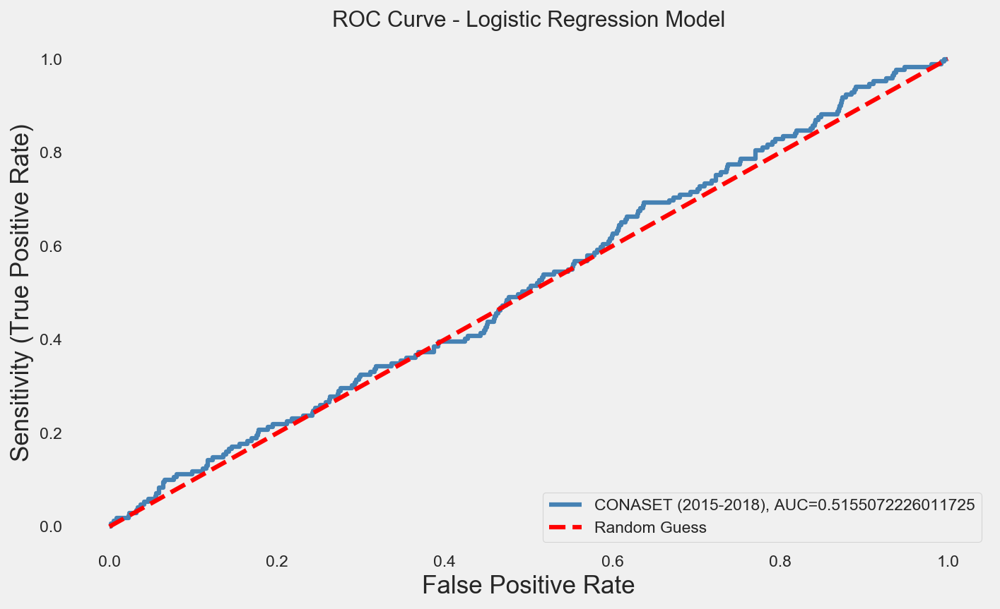

In [150]:
# import the metrics class
from sklearn import metrics
y_pred_proba = model_logreg.predict_proba(X_test)[::,1]
# display(y_pred_proba >= np.mean(y_pred_proba))
# temp = (np.median(y_pred_proba) + 2*np.std(y_pred_proba))
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc_logreg = metrics.roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr,tpr,label="CONASET (2015-2018), AUC="+str(auc_logreg),color='steelblue',lw=3)
plt.plot([0,1],[0,1],'r-',label='Random Guess',color='red',lw=3,linestyle='dashed')
plt.grid()
plt.legend(loc=4)
plt.ylabel("Sensitivity (True Positive Rate)")
plt.xlabel("False Positive Rate")
plt.title("ROC Curve - Logistic Regression Model", size = 15)
plt.show();

In [151]:
print(f"Train Accuracy: {model_logreg.score(X_train, y_train)}")
print(f"Test Accuracy:  {metrics.accuracy_score(y_test, y_pred)}")
print(f"AUC:            {auc_logreg}")

Train Accuracy: 0.9907338769458859
Test Accuracy:  0.9906043253460833
AUC:            0.5155072226011725


#### Confusion Matrix 

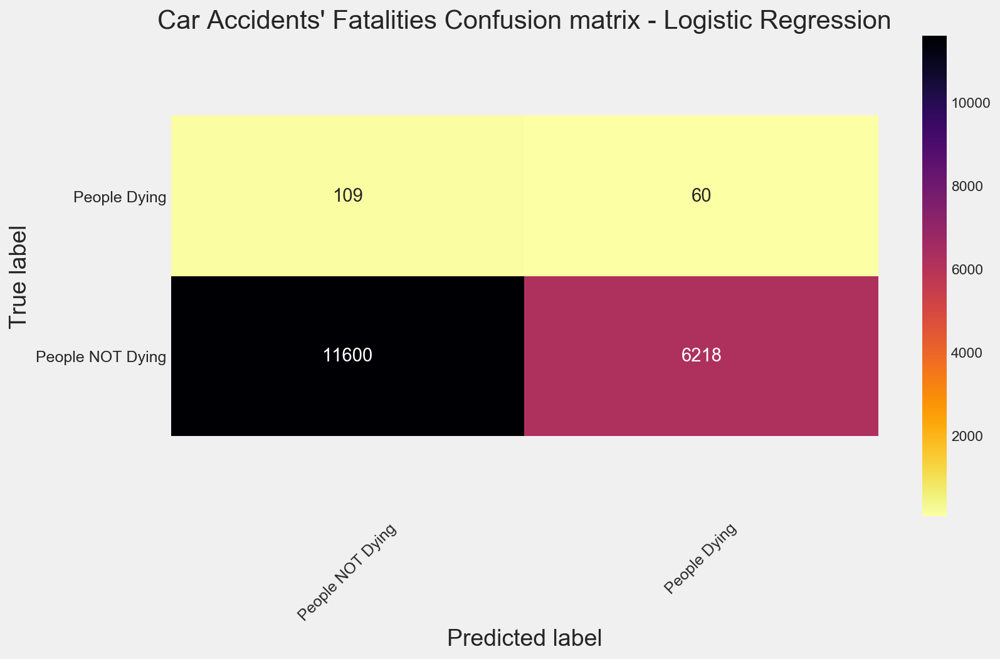

<Figure size 1200x300 with 0 Axes>

In [152]:
cnf_matrix = metrics.confusion_matrix(y_test, y_pred_proba >= (np.median(y_pred_proba) +.3*np.std(y_pred_proba)))
# cnf_matrix
class_names=["People NOT Dying", "People Dying"] # name  of classes
fig, ax = plt.subplots()


# create heatmap
ax = sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="inferno_r" ,fmt='g')
ax.xaxis.set_label_position("bottom")
plt.tight_layout()
plt.title("Car Accidents' Fatalities Confusion matrix - Logistic Regression", size = 20)
plt.tight_layout()
tick_marks = np.arange(len(class_names)) + 0.5
plt.xticks(tick_marks, ["People NOT Dying", "People Dying"], rotation=45, size = 12)
plt.yticks(tick_marks, ["People NOT Dying", "People Dying"], size = 12, rotation = 0)
plt.ylabel('True label', size = 18)
plt.xlabel('Predicted label', size = 18)
ax.set_ylim(-0.5,len(cnf_matrix)+0.5)
plt.figure(figsize=(8,2));

For our project, we will be also using a __Confusion Matrix__ to evaluate the Classification models. We use Confusion Matrix in Classificatiion problems because the output is a feature. It is a measurment in performance of our AUC of the ROC Curve.

We will be modifying the confusion matrix as what represents the most predictive values of the ROC Curve by changing their location with respect to the Standard Deviation.

The Matrix is composed by 4 main components:
- __True Positive (top right)__ : Predicted Positive and it's True
    - The model correctly labels that people died
    
    
- __False Positive (Error) (bottom right)__: Predicted Positive but it's False
    - Means that people that did not die are counted as dead
    
    
- __False Negative (Error) (top left)__: Predicted Negative but it's False
    - Means that people that died are counted as not dead
    
    
- __True Negative (bottom left)__: Predicted Negative and it's True
    - The model correctly label that people did not die

__Recall__: TP/(TP + FN) is the ability of the model to return all relevant instances. If we want to know whether or not people are dying. 

__Precission__: TP /(TP + FP) is the ability of the model to return only the corrected predicted or relevant instances.


Some important notes:
- Each category is a count. Not a probability.

- Confusion Matrices only work with positive classes - People dying is the Positive class and People NOT dying is Negative class.

- The threshold could be set to any value between 0 and 1. Every threshold results in a different confusion matrix and a number of thresholds will result in a large number of confusion matrices which is not the best way to work.

- ROC curve shows how the recall vs precision relationship changes as we vary the threshold for identifying a positive in our model.


### Understanding our Logistic Model

Our Logistic Regression Model is not capable of differentiating between features. This is a problem for our goal because we want a model that is strong enough to differentiate between features. However, during EDA we found some interesting aspects about our data. Above, it was shown that less than 1% of accidents recorded by the CONASET from 2015 to 2018 resulted in casualties of pedestrians or drivers. In other words, there exists a great difference in the number of people not dying and dying during accidents. 

According to [this article](https://www.edmunds.com/car-safety/are-smaller-cars-as-safe-as-large-cars.html), different sizes of cars might affect the safety of their passengers differently. We would like to know what were the car models that were involved in the accidents recorded. The article talks about the "Decade of Improvement in car safety". It shows the different fatality rates in 2005 and 2015 considering the size of the cars, SUVs, and Pickups. In a way this Logistic Regression shows the argument of the article is correct since over 99% of people that were encountered in car accidents as pedestrians or drivers did not suffer casualties.

Our Confusion Matrix also has some interesting results. We moved the threshold of our Confusion Matrix by .3 Standard Deviations above the median in order to get the highest peak as posible of the ROC Curve.

***

### Random Forest with one-hot encoding in the categorical features

Since the proportion of people dying and not dying in accidents does not favor us, __we will try to identify the most important features that the Chilean government and CONASET should look after in order to prevent higher number of accidents.__

Now we can move on to a more powerful model, the Random Forest. This takes the idea of a single Decision Tree, and creates an ensemble model out of hundreds or thousands of trees to reduce the variance.  We can define a Decision Tree as an interpretable model because it makes classifications much like we do: we ask a sequence of queries about the available data we have until we arrive at a decision. 

For this project, we will not be using Decision Trees by themselves, because of the low performance and high chance of running into overfitting. Instead, we will use a Random Forest Classifier.

In Random Forest each tree is trained on a random set of the observations, and for each split of a node, only a subset of the features are used for making a split. When making predictions, the random forest averages the predictions for each of the individual decision trees for each data point in order to arrive at a final classification.

We will use the Random Forest model using one-hot encoding to turn the categorical features into numerical features.

Steps:
- We will use One-Hot Encoding using `pd.get_dummies`.
- Then we will import the necessary Random Forest object to use the model. `model_rf=RandomForestClassifier(n_estimators=100)` will build a forest of 100 Decision Trees.
- We will train our training datasets using `.fit()` so we can obtain optimized betas with `.predict()`.

Notes:
- We will exclude `Deaths Quantity` and `Death` features because `Death` is our target feature that we want to predict, which tell us whether or not in an accident there was a casuality/casualties (binary column of 1s and 0s) and `Deaths Quantity` is the amount of people that suffered casualties in an accidents. Although `Deaths Quantity` is not our target prediction feature, we think that it should be excluded from the regression because of the very close similarity with our target feature.

- The `geometry` is excluded because it contains `POINT` data type values that cannot be encoded. Recall that `geometry` gives the exact coordinate of each accident in the city of Santiago. In this project is used for the Geo representation of the Data.

In [153]:
feat_cols = [
   'Accident Type',
    'Atmospheric State',
    'Cause',
    'Date',
    'Deaths Quantity',
    'District', 
    'Hour',
    'Medium Injuries',
    'Minor Injuries', 
    'Serious Injuries', 
    'Road_Direction', 
    'Road_Type',
    'Street 1',
    'Street 2',
    'Weather',
    'Year',
    'Zone', 
#     'geometry', 
    'Month',
    'Day',
    'Week_of_Year',
    'Day Of Year',
    'Quarter', 
    'Season',
    'Death',
    'Holiday',
    'Month_Numeric', 
    'Day_Numeric'
]
num_binary_features = [ 'Date',
                       'Deaths Quantity',
                       'Hour',
                       'Medium Injuries',
                        'Minor Injuries', 
                        'Serious Injuries', 
                        'Year',
                        'Month',
                        'Day',
                        'Week_of_Year',
                        'Day Of Year',
                        'Quarter', 
                        'Season',
                        'Death',
                        'Holiday',
                        'Month_Numeric', 
                        'Day_Numeric'
]

categorical_features = ['Accident Type',
                         'Atmospheric State',
                         'Cause',
                        'District', 
                        'Road_Direction', 
                        'Road_Type','Street 1',
                        'Street 2',
                        'Weather',
                        'Zone'
                        ]

# One-hot encode
features = pd.get_dummies(conaset_df.drop(["Deaths Quantity", "geometry"], axis = 1))# Features

# Target are the values we want to predict
target = np.array(conaset_df["Death"]) # Target variable

# Remove the target from the features
features = features.drop("Death", axis=1)

# Saving feature names for later use
feature_list = list(features.columns)

# Convert to array
features = np.array(features)

In [154]:
#Let's train our model - 70% training and 30% test
from sklearn.model_selection import train_test_split

X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(features, target, test_size=0.3) 

In [155]:
#Import Random Forest Model
from sklearn.ensemble import RandomForestClassifier

#Create a Gaussian Classifier
model_rf=RandomForestClassifier(n_estimators=100, random_state=42)

In [156]:
#Train the model using the training sets y_pred or optimized beta
model_rf.fit(X_train_rf,y_train_rf)

RandomForestClassifier(random_state=42)

In [157]:
y_pred_rf=model_rf.predict(X_test_rf)

In [158]:
# Get numerical feature importances
importances = list(model_rf.feature_importances_)

# List of tuples with variable and importance
feature_importances = [(feature, importance) for feature, importance in zip(feature_list, importances)]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: Day Of Year          Importance: 0.030469587692755925
Variable: Week_of_Year         Importance: 0.025763680540685424
Variable: Accidents_per_District_per_200000_People Importance: 0.023390015611536228
Variable: Population_per_District Importance: 0.0230578604695043
Variable: Accidents_per_District_per_Population Importance: 0.021474518290485464
Variable: Cause_PEATON CRUZA CALZADA FUERA PASO PEATONES Importance: 0.020780724707798282
Variable: Minor Injuries       Importance: 0.020655097577928373
Variable: Day_Numeric          Importance: 0.01819008615251694
Variable: Hour                 Importance: 0.01682714815771308
Variable: Accident Type_ATROPELLO Importance: 0.016350508857157175
Variable: Month_Numeric        Importance: 0.015639226150943295
Variable: Serious Injuries     Importance: 0.012279972302017274
Variable: Year                 Importance: 0.011815291082929225
Variable: Road_Type_CONCRETO   Importance: 0.010743302919610741
Variable: Road_Type_ASFALTO    Importan

Variable: Street 1_PLAZA ERCILLA Importance: 1.6670100297322413e-05
Variable: Street 1_COSTANERA SUR Importance: 1.6647019468862325e-05
Variable: Date_2018-03-23      Importance: 1.6641854489231287e-05
Variable: Street 2_RUPIA HINDU Importance: 1.6639656202686926e-05
Variable: Street 1_ELIAS FERNANDEZ ALBANO Importance: 1.662062178160307e-05
Variable: Date_2018-08-11      Importance: 1.6609600779733955e-05
Variable: Street 2_VERGARA     Importance: 1.65513033781119e-05
Variable: Street 1_ALCALDE PEDRO ALARCON Importance: 1.654443065846271e-05
Variable: Street 2_MARIA ELENA Importance: 1.6533374331696983e-05
Variable: Date_2018-01-01      Importance: 1.653237852884958e-05
Variable: Date_2018-02-19      Importance: 1.6514044924710187e-05
Variable: Street 2_MARCHANT PEREIRA Importance: 1.6504934275527273e-05
Variable: Date_2018-10-25      Importance: 1.649657410223545e-05
Variable: Street 1_NVA LAS CONDES Importance: 1.6494134803339625e-05
Variable: Date_2018-09-07      Importance: 1.6471

Variable: Street 2_MARURI      Importance: 1.2085081156937959e-06
Variable: Street 1_STA FILOMENA Importance: 1.2084518317751351e-06
Variable: Street 2_INGLATERRA  Importance: 1.2081886234948545e-06
Variable: Street 1_LUMEN       Importance: 1.2074785043211411e-06
Variable: Street 2_STA MARGARITA Importance: 1.2044784770035675e-06
Variable: Street 1_ALCALDE LUIS OSORIO Importance: 1.2040498203274595e-06
Variable: Street 1_QUINCHAMALI Importance: 1.2032332131582315e-06
Variable: Street 1_ANGAMOS     Importance: 1.2016097335415409e-06
Variable: Street 2_LOS JARDINES Importance: 1.2013727678478872e-06
Variable: Street 1_ALVEAR      Importance: 1.1969925212329455e-06
Variable: Street 1_CARLOS ALVARADO Importance: 1.1963318018944572e-06
Variable: Street 1_GRAL FRANCISCO FRANCO Importance: 1.1961088958342439e-06
Variable: Date_2018-04-24      Importance: 1.193623216751592e-06
Variable: Street 1_STO TOMAS   Importance: 1.1919342008356992e-06
Variable: Street 2_LO ECHEVERS Importance: 1.191928

Variable: Street 2_SAN ANTONIO COMAICO Importance: 8.009311802556251e-08
Variable: Street 2_HERNAN OLGUIN Importance: 8.004138517952424e-08
Variable: Street 2_PUCARA      Importance: 8.001239363220296e-08
Variable: Street 2_ALBERTO VALENZUELA LLANOS Importance: 7.980290852540784e-08
Variable: Street 2_QUINQUELES  Importance: 7.952756843132854e-08
Variable: Street 2_ISLUGA      Importance: 7.917195020326498e-08
Variable: Street 2_BRIGADIER DE LA CRUZ Importance: 7.903600369155774e-08
Variable: Street 2_SAN SIMON   Importance: 7.889973964851238e-08
Variable: Street 2_FABRICA     Importance: 7.862750744636591e-08
Variable: Street 2_REPUBLICA DE SIERRA LEONA Importance: 7.857764298793036e-08
Variable: Street 2_CROACIA     Importance: 7.850380393967548e-08
Variable: Street 1_RUCALIN     Importance: 7.834977383060054e-08
Variable: Street 2_GERMAN EBBINGHAUSS Importance: 7.821939562502386e-08
Variable: Street 1_CAMINO GINO GIRARDI Importance: 7.819743035311633e-08
Variable: Street 2_SANTA TER

Variable: Street 1_AGUSTIN DENEGRI Importance: 0.0
Variable: Street 1_AGUSTIN EDWARDS Importance: 0.0
Variable: Street 1_AGUSTIN RIESCO Importance: 0.0
Variable: Street 1_AHUMADA     Importance: 0.0
Variable: Street 1_ALAMEDA     Importance: 0.0
Variable: Street 1_ALAMEDA ORIENTE Importance: 0.0
Variable: Street 1_ALBANO      Importance: 0.0
Variable: Street 1_ALBERT EINSTEIN Importance: 0.0
Variable: Street 1_ALBERTO EDWARDS Importance: 0.0
Variable: Street 1_ALBERTO FIGUEROA Importance: 0.0
Variable: Street 1_ALBERTO GONZALEZ Importance: 0.0
Variable: Street 1_ALBERTO LOSECO Importance: 0.0
Variable: Street 1_ALBERTO MERMOD Importance: 0.0
Variable: Street 1_ALBERTO RISOPATRON Importance: 0.0
Variable: Street 1_ALBERTO UNDURRAGA Importance: 0.0
Variable: Street 1_ALBORADA    Importance: 0.0
Variable: Street 1_ALC ALBERTO KRUMM Importance: 0.0
Variable: Street 1_ALC GERMAN DOMINGUEZ Importance: 0.0
Variable: Street 1_ALC JORGE MONCKEBERG Importance: 0.0
Variable: Street 1_ALC MANUEL M

Variable: Street 1_YOLANDA     Importance: 0.0
Variable: Street 1_YUMBEL      Importance: 0.0
Variable: Street 1_ZADAR       Importance: 0.0
Variable: Street 1_ZANARTU     Importance: 0.0
Variable: Street 1_ZANZIBAR ORIENTE Importance: 0.0
Variable: Street 1_ZAPALLAR    Importance: 0.0
Variable: Street 1_ZEUS        Importance: 0.0
Variable: Street 1_ZINC        Importance: 0.0
Variable: Street 1_ZORRILLA DE SAN MARTIN Importance: 0.0
Variable: Street 1_ZULIA       Importance: 0.0
Variable: Street 1_ZURICH NORTE Importance: 0.0
Variable: Street 2_1           Importance: 0.0
Variable: Street 2_1 NOR ORIENTE Importance: 0.0
Variable: Street 2_1 NORTE     Importance: 0.0
Variable: Street 2_10 JULIO HUAMACHUCO Importance: 0.0
Variable: Street 2_11 DE MAYO  Importance: 0.0
Variable: Street 2_11 DE SEPTIEMBRE Importance: 0.0
Variable: Street 2_11 NORTE    Importance: 0.0
Variable: Street 2_11 SUR      Importance: 0.0
Variable: Street 2_12 DE FEBRERO Importance: 0.0
Variable: Street 2_12 NORT

Variable: Street 2_RIO BOROA   Importance: 0.0
Variable: Street 2_RIO CALLE CALLE Importance: 0.0
Variable: Street 2_RIO CHOAPA  Importance: 0.0
Variable: Street 2_RIO CISNES  Importance: 0.0
Variable: Street 2_RIO CONGO   Importance: 0.0
Variable: Street 2_RIO DE LA PLATA Importance: 0.0
Variable: Street 2_RIO ELQUI   Importance: 0.0
Variable: Street 2_RIO GRANDE  Importance: 0.0
Variable: Street 2_RIO LLUTA   Importance: 0.0
Variable: Street 2_RIO MADEIRA Importance: 0.0
Variable: Street 2_RIO MAULE   Importance: 0.0
Variable: Street 2_RIO NILQUE  Importance: 0.0
Variable: Street 2_RIO SECO    Importance: 0.0
Variable: Street 2_RIO SERRANO Importance: 0.0
Variable: Street 2_RIO SNAKE   Importance: 0.0
Variable: Street 2_RIO TAMESIS Importance: 0.0
Variable: Street 2_RIO TOLTEN  Importance: 0.0
Variable: Street 2_RIO VERGARA Importance: 0.0
Variable: Street 2_ROBERTO BURNS Importance: 0.0
Variable: Street 2_ROBERTO GUZMAN Importance: 0.0
Variable: Street 2_ROBERTO LOPEZ MENESES Import

In [159]:
out = pd.Series(dict(feature_importances))

#### Visualization of Important Features

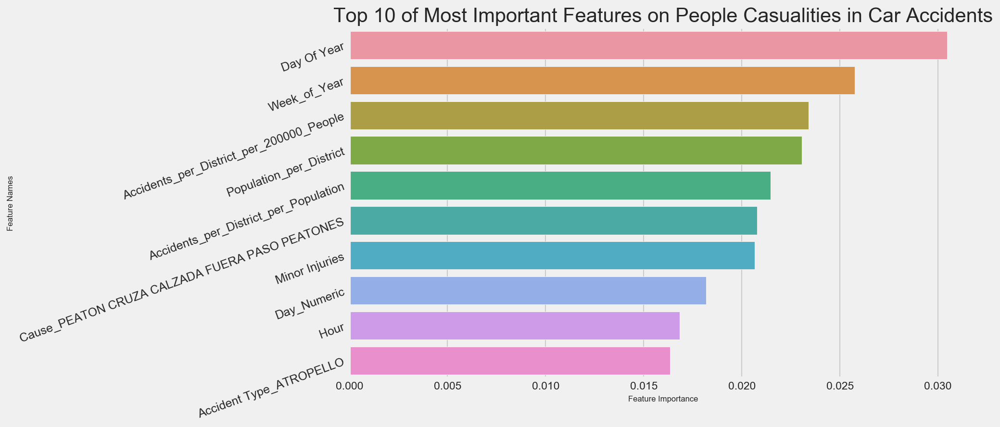

In [160]:
sns.barplot(x=out.values, y=out.index, order = out.index[:10])
plt.xlabel("Feature Importance", size = 8)
plt.ylabel("Feature Names", size = 8)
plt.yticks(rotation = 20, size=12)
plt.title("Top 10 of Most Important Features on People Casualities in Car Accidents", size = 20);

#### ROC Curve

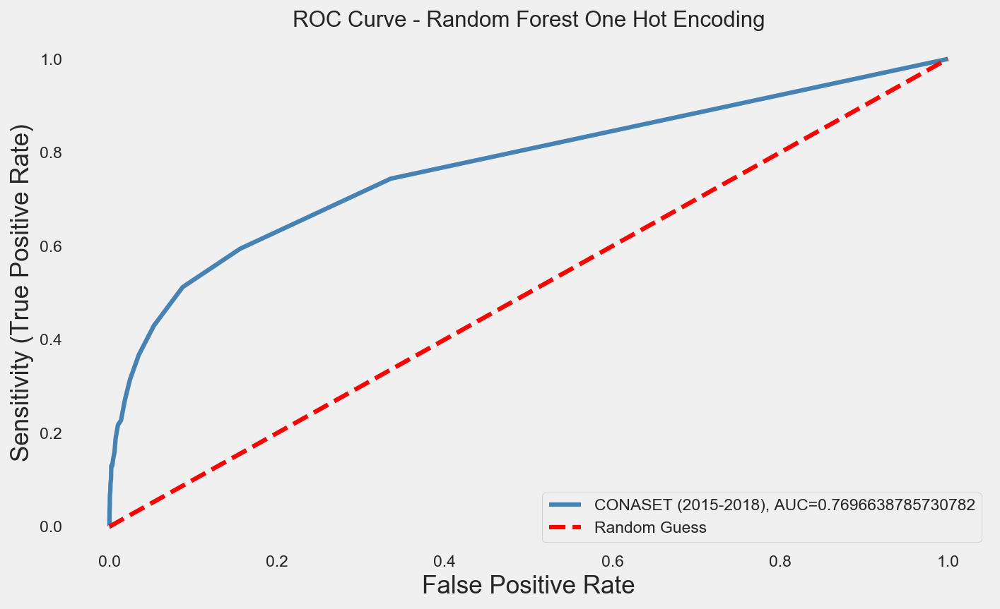

In [161]:
from sklearn import metrics
y_pred_proba_rf = model_rf.predict_proba(X_test_rf)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test_rf,  y_pred_proba_rf)
auc_rf = metrics.roc_auc_score(y_test_rf, y_pred_proba_rf)
plt.plot(fpr,tpr,label="CONASET (2015-2018), AUC="+str(auc_rf),color='steelblue',lw=3)
plt.plot([0,1],[0,1],'r-',label='Random Guess',color='red',lw=3,linestyle='dashed')
plt.legend(loc=4)
plt.grid()
plt.ylabel("Sensitivity (True Positive Rate)")
plt.xlabel("False Positive Rate")
plt.title("ROC Curve - Random Forest One Hot Encoding", size = 15)
plt.show();

#### Confusion Matrix

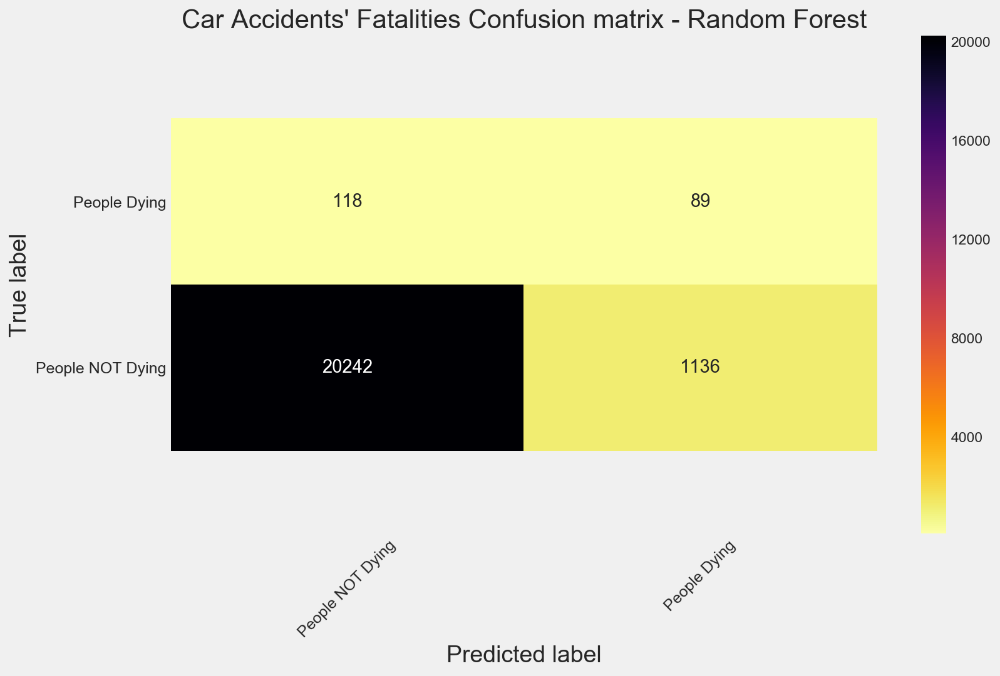

<Figure size 1200x300 with 0 Axes>

In [162]:
from sklearn import metrics
cnf_matrix = metrics.confusion_matrix(y_test_rf, y_pred_proba_rf >= (np.median(y_pred_proba_rf) + 2*np.std(y_pred_proba_rf)))
# cnf_matrix
class_names=["People NOT Dying", "People Dying"] # name  of classes
fig, ax = plt.subplots()


# create heatmap
ax = sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="inferno_r" ,fmt='g')
ax.xaxis.set_label_position("bottom")
plt.tight_layout()
plt.title("Car Accidents' Fatalities Confusion matrix - Random Forest", size = 20)
tick_marks = np.arange(len(class_names)) + 0.5
plt.xticks(tick_marks, ["People NOT Dying", "People Dying"], rotation=45, size = 12)
plt.yticks(tick_marks, ["People NOT Dying", "People Dying"], size = 12, rotation = 0)
plt.ylabel('True label', size = 18)
plt.xlabel('Predicted label', size = 18)
ax.set_ylim(-0.5,len(cnf_matrix)+0.5)
plt.figure(figsize=(8,2));

- __True Positive (top right)__ : Predicted Positive and and it's True
    - the model correctly labels that people died
    
    
- __False Positive (Error) (bottom right)__: Predicted Positive but it's False
    - means that people did not die are counted as dead
    
    
- __False Negative (Error) (top left)__: Predicted Negative but it's False
    - means that people that died are counted as not dead
    
    
- __True Negative (bottom left)__: Predicted Negative and it's True
    - the model correctly label that people did not die

In [163]:
print(f"Train Accuracy:         {model_rf.score(X_train_rf, y_train_rf)}")
print(f"Test Accuracy:          {metrics.accuracy_score(y_test_rf, y_pred_rf)}")
print(f"Area Under the Curve:   {auc_rf}")

Train Accuracy:         0.9999801437591835
Test Accuracy:          0.9904100069492703
Area Under the Curve:   0.7696638785730782


### Understanding our Random Forest Model and Comparing with Logistic Regression using the ROC Curve

Although we still have very similar Training and Test Accuracies, we have been able to increase the power of predicting if people die or not in car accidents using this project data. Our Area of the Roc Curve has gone above 75% which compared to the Logistic regression of about 50% is predicting much better.

The reader should understand why we are using the ROC Curve as a measure of comparison between the models. When needed to visualize a comparison of a multi-class classification problem, we learned in Data 100 Fall 2019 that using a ROC Curve helps to understand the performance of a classification model and we can compare its performance to another classification model that is also using a ROC Curve.

The ROC Curve is a probability curve and AUC represents measure of separability among features. In other words, they tell how much the model is capable of distinguishing between features. Higher the AUC, better the model is at predicting 0s as 0s and 1s as 1s.

In the first ROC Curve we saw an AUC of about 50%. This means that the model has no feature separation and using Logistic Regression it is really hard to differentiate between different features.

The Random Forest model has a AUC of about 75%, which means that there is a 75% chance that the Random Forest Model will be able to distinguish between the people that suffered casualties and the people that did not. In addition, we can extract from the `RandomForestClassifier` the most important features that help to predict our target such as, `Day Of Year`, `Week_of_Year`, and `Accidents_per_District_per_200000_People`.

The difference between the AUCs means that having a 50% AUC model has no capacity to distinguish when people die or not in accidents compared to a much powerful predictor model of the Random Forest model.

***

### Logistic Regression Using Pipeline

So far, we have seen a low performance in the Logistic Regression Model and a slightly better performance in the Random Forest. Turning our attention to how the Logisitc Regression model can be improved and let's see if the algorithm performs better when features are on a relatively similar scale and close to normally distributed. In Data 100 Fall 2019, we learned about different techniques on pre-processin the data prior modeling.

We learned about Scaling, Standarized, and Normalizing:
- Scaling is to change the range of values. In other words, we keep the proportions of the original values, but we make the values smaller.

- Standarizing  is to change the values so that the Standard Deviation of the values of a feature is close to the mean of the values of the features.

- Normalizing is to do either Scaling or Standarizing but by taking its mean or average.


We want to compare if performing these techniques can actually help features to arrive in a more digestable form for our models.

For this section of the project, we will use a preprocessing method from sklearn called `sklearn.preprocessing.StandardScaler`. It standardizes a feature by subtracting the mean and then scaling to unit variance. Unit variance means dividing all the values by the standard deviation. StandardScaler does not meet the strict definition of scale.

We can use the idea of a Pipeline that glue together the `StandardScaler()` and our desired model in order to ensure that during the Cross Validation the `StandardScaler()` is fitted to only the training fold, just like we used for our `model.fit()`

We will apply one-hot encoding in all features.



In [164]:
# One-hot encode
features = pd.get_dummies(conaset_df.drop(["Deaths Quantity", "geometry"], axis = 1))# Features

# Target are the values we want to predict
target = np.array(conaset_df["Death"]) # Target variable

# Remove the target from the features
features = features.drop("Death", axis=1)

# Saving feature names for later use
feature_list = list(features.columns)

# Convert to array
features = np.array(features)

In [165]:
from sklearn.model_selection import train_test_split
X_train_logreg_cv, X_test_logreg_cv, y_train_logreg_cv, y_test_logreg_cv = train_test_split(features, target, test_size = 0.25, random_state = 42)


In [166]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# scale = StandardScaler().fit(X_test_logreg_cv)
# X_train_scaled = scale.transform(X_train_logreg_cv)


pipeline = Pipeline([
    ('scaler',StandardScaler()),
    ('clf', LogisticRegression(max_iter = 1000))
])

# use the pipeline object as you would
# a regular classifier
pipeline.fit(X_train_logreg_cv,y_train_logreg_cv)

y_pred_logreg_cv = pipeline.predict(X_test_logreg_cv)

In [167]:
# # import the class
# from sklearn.linear_model import LogisticRegressionCV

# # instantiate the model (using the default parameters)
# model_logreg_cv= LogisticRegression()

# # fit the model with data
# model_logreg_cv.fit(X_train_scaled,y_train_logreg_cv)

# #
# y_pred_logreg_cv=model_logreg.predict(X_test_logreg_cv)

#### ROC Curve

array([False, False, False, ..., False, False, False])

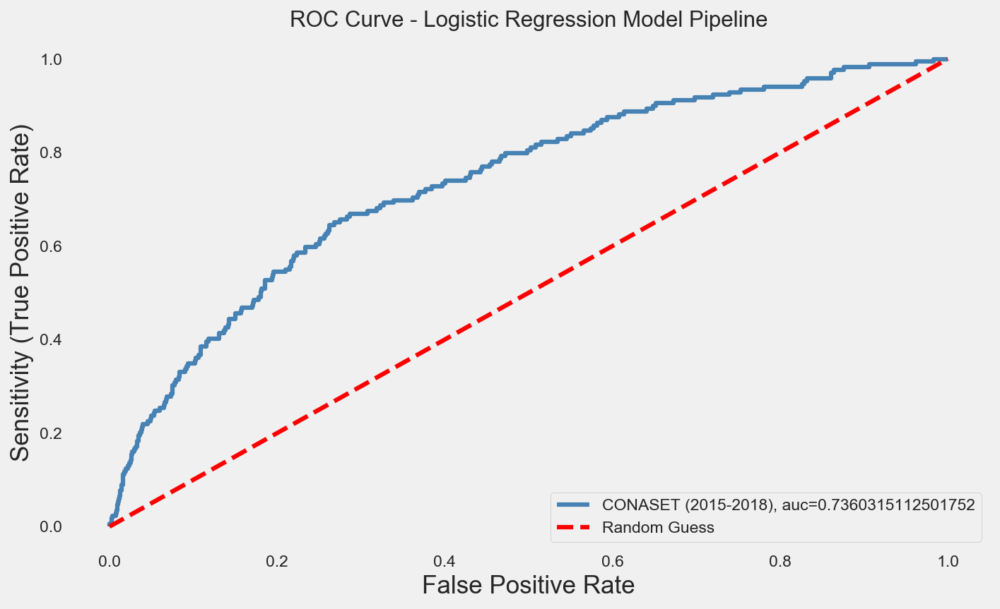

In [168]:
# import the metrics class
from sklearn import metrics
y_pred_proba = pipeline.predict_proba(X_test_logreg_cv)[::,1]
display(y_pred_proba >= np.mean(y_pred_proba))
# temp = (np.median(y_pred_proba) + 2*np.std(y_pred_proba))
fpr, tpr, _ = metrics.roc_curve(y_test_logreg_cv,  y_pred_proba)
auc_logreg_cv = metrics.roc_auc_score(y_test_logreg_cv, y_pred_proba)
plt.plot(fpr,tpr,label="CONASET (2015-2018), auc="+str(auc_logreg_cv),color='steelblue',lw=3)
plt.plot([0,1],[0,1],'r-',label='Random Guess',color='red',lw=3 ,linestyle='dashed')
plt.grid()
plt.legend(loc=4)
plt.ylabel("Sensitivity (True Positive Rate)")
plt.xlabel("False Positive Rate")
plt.title("ROC Curve - Logistic Regression Model Pipeline", size = 15)
plt.show();

In [169]:
print(f"Train Accuracy: {pipeline.score(X_train_logreg_cv, y_train_logreg_cv)}")
print(f"Test Accuracy:  {metrics.accuracy_score(y_test_logreg_cv, y_pred_logreg_cv)}")
print(f"AUC:            {auc_logreg_cv}")

Train Accuracy: 0.997646404744255
Test Accuracy:  0.9788180352476789
AUC:            0.7360315112501752


#### Confusion Matrix

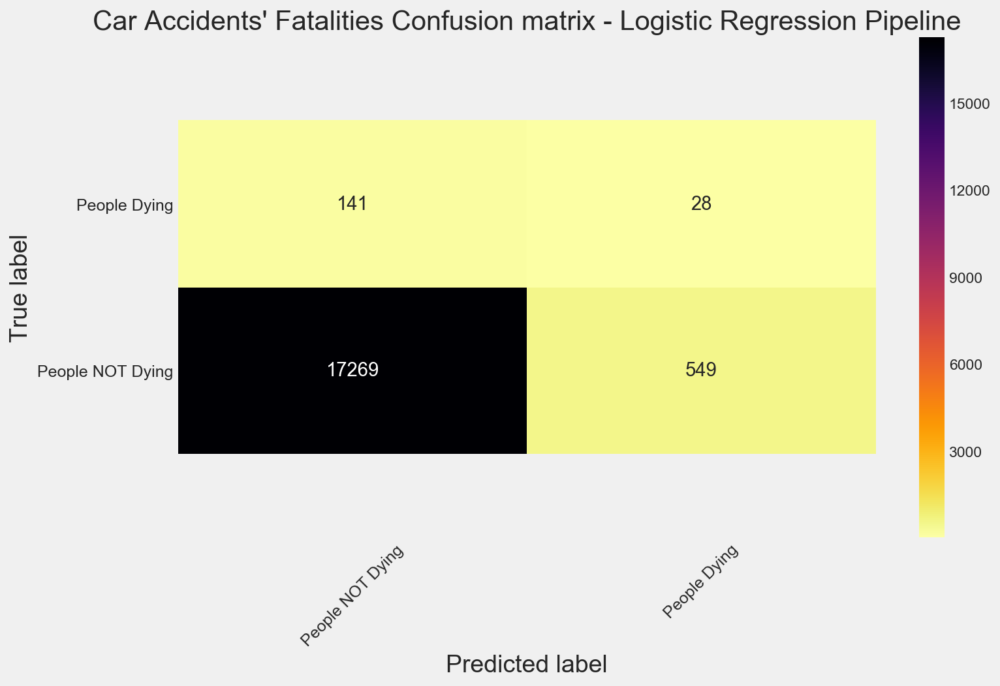

<Figure size 1200x300 with 0 Axes>

In [170]:
cnf_matrix = metrics.confusion_matrix(y_test_logreg_cv, y_pred_proba >= (np.median(y_pred_proba) +.3*np.std(y_pred_proba)))
# cnf_matrix
class_names=["People NOT Dying", "People Dying"] # name  of classes
fig, ax = plt.subplots()


# create heatmap
ax = sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="inferno_r" ,fmt='g')
ax.xaxis.set_label_position("bottom")
plt.tight_layout()
plt.title("Car Accidents' Fatalities Confusion matrix - Logistic Regression Pipeline", size = 20)
plt.tight_layout()
tick_marks = np.arange(len(class_names)) + 0.5
plt.xticks(tick_marks, ["People NOT Dying", "People Dying"], rotation=45, size = 12)
plt.yticks(tick_marks, ["People NOT Dying", "People Dying"], size = 12, rotation = 0)
plt.ylabel('True label', size = 18)
plt.xlabel('Predicted label', size = 18)
ax.set_ylim(-0.5,len(cnf_matrix)+0.5)
plt.figure(figsize=(8,2));

For our project, we will be also using a __Confusion Matrix__ to evaluate the Classification models. We use Confusion Matrix in Classificatiion problems because the output it is a feature. It is a measurment in performance of our AUC of the ROC Curve.

The Matrix is composed by 4 main components:
- __True Positive (top right)__ : Predicted Positive and and it's True
    - the model correctly labels that people died
    
    
- __False Positive (Error) (bottom right)__: Predicted Positive but it's False
    - means that people did not die are counted as dead
    
    
- __False Negative (Error) (top left)__: Predicted Negative but it's False
    - means that people that died are counted as not dead
    
    
- __True Negative (bottom left)__: Predicted Negative and it's True
    - the model correctly label that people did not die

### Understanding the new Logistic Regression

We have a much better performance compared to the first Logistic Regression. Compared to Random Forest our Logistic regression + Pipeline does not do as well. However, these results are okay since we already have discussed the problem of having a really high number of people not dying. In other words, Logistic Regression is not a suitable model to use in a case such as this one.

***

## Conclusion and Future Work

We have identified important features that help us predict when people are losing their lives in car accidents. We also have found that we can actually make our models perfom better using `Pipeline` objects and `StandardScaler`.

Things that we would have wished to obtain from the original dataset:
- more specified information about the type of roads, causes of accidents because they were either not descriptive enough or some descriptions had too many random descriptions.
- more information about the context of the accident such as speed of wind, speed of when the cars collide, and temperature of the enviroment, etc.
- in the case of people under the influence of alcohol or drugs it would have been benefitial for us to have that data and see if we could feature engineering it.
- have a more consistent dataset throughout the year. Due to this lack of consistent datasets we had to drop many features from older datasets (2015, 2016) because of the lack of proper compilation.
- have full access to the truthfulness of the data. During this project we found that some data was supect, such as when there were no accidents reported by the government during the last week of each year. (See Heat Maps)

__Future Work__:
- tune Hyperparameters of Models. Maybe use a `GridSearchCV` that exhaustively looks for each of the different parameter combinations in order to pick the best hyperparameters for the model or manually compare test vs training ROC Curve AUC performance to see when the dataset starts declining its performance.
- use a _Poisson Regression Model_ because of the great variation of values in our target variable. In other words, for cases like our project where only a few people (less than 1%) are losing their lives when they engange in an accident and the great majority are not, Logistic Regression does not work effectively here and Poisson Regression has _Rare Events_ that provides a better insight than Logistic Regression and might work better.
- obtain data of car models, year, etc to improve our feature engineering. 

With current results

- We have a somewhat accurate prediction model with our Random Forest that is backed up by the improved version of the Logistic Model. Extracting the most features from the Random Forest can give us hints as to where and when we can approach solid policies in order to prevent deathly car involved accidents. In this way, government and citizens can be fully informed when advocating for future policies and regulations to improve everybody's safety. Test